# CISC 873 Data Mining - A3 - Chest X-Ray Classification Problem
## Gavin McClelland - 15gm8 - 10211444
### Due: Wednesday 3 November 2021, 23:59 EST

⏰⚠ This notebook has been adapted from the provided template "A3_template.ipynb"⚠⏰

In [1]:
# Note that before running the template, I needed to upload the dataset to my
# google drive and mount it (for colab), as simply uploading the datasets as
# before took awhile, and made my browser time out 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Task 1: Meme Competition

This is how the data science life cycle for tuning feels when you're stuck.

![picture](https://drive.google.com/uc?id=1M0wEQxZ_lDzdJi8yssTdRwMLyobMtWe5)

# Task 2: Understand the Template (Trial 0)

For this section, I have added comments where appropriate, and answered the initial questions at the end of the section (i.e. experimental protocol, etc.)

In [2]:
# importing dependencies
from tqdm.notebook import tqdm # used to create progress bars, specifically for iteratively loading the images in this assignment
from PIL import Image # used for loading images
import pandas as pd # for dataframe manipulation
import os # for filesystem operations and interfacing with the os
import numpy as np # for array and quick math operations


def load_data(folder):
    images = [] # initializing a list for image samples
    for file in tqdm(os.listdir(folder)): # iterate through all image files in input folder
        file_id = file.replace('.png', '') # stripping file extension to uniquely identify each sample
        image = Image.open(
            os.path.join(folder, file) # load each image based on the directory path
        ).convert('LA').resize((256, 256)) # 'LA' means convert to grayscale (with alpha since the transparency channel is included with pngs)
        arr = np.array(image) # initialize an array object containing this one image
        images.append(
            (int(file_id), arr) # append the unique image id and image data as a new entry to the images list (i.e. [ID, data]) 
        )
    images.sort(key=lambda i: i[0]) # sort the input samples by ascending ID
    return np.array([v for _id, v in images]) # return each image data as an array



x_train = load_data('/content/drive/MyDrive/Colab Notebooks/train') # load all training data using the function defined above
y_train = pd.read_csv('/content/y_train.csv')['infection'] # load all of the target values from the provided csv

  0%|          | 0/487 [00:00<?, ?it/s]

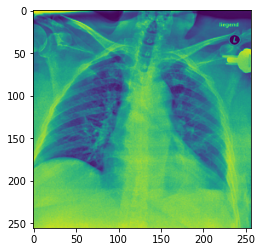

In [68]:
# check image 
import matplotlib.pyplot as plt # pyplot is a common dataviz library
plt.imshow(x_train[0, :, :, 0]) # display the image data from the first sample
# also looks like pyplot uses a default colour map as these images were imported as grayscale 

In [4]:
import tensorflow as tf 
from tensorflow.keras.models import Sequential # used to define models as a sequence of operations/layers
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Dropout, Input # different layer types for use in different model configurations

def build(): # method used to build a fully-connected network
    img_in = Input(shape=(256, 256, 2)) # shape of our input images, 256x256 pixels, and 2 channels since grayscale
    flattened = Flatten()(img_in) # flattening the input for each sample into a 1D shape 256x256x2 = 131072 
    fc1 = Dense(64)(flattened) # dense layer of 64 neurons on top of the flattened input
    # fc1 = Dropout(0.3)(fc1) <-- dropout layer with a probability of 30%, could be used to prevent overfitting in deep networks
    fc2 = Dense(32)(fc1) # dense layer of 32 neurons
    # fc2 = Dropout(0.3)(fc2) <-- another dropout layer, see above
    output = Dense(1, activation = 'sigmoid')(fc2) # output layer used to make predictions
    model = tf.keras.Model(inputs=img_in, outputs=output) # assigning the model
    return model


model = build()
model.compile(
        optimizer=tf.keras.optimizers.Adam(), # optimizer implementing the Adam algorithm for updating weights
        loss='binary_crossentropy', # loss function comparing predicted probabilities to actual class value
        metrics=['BinaryAccuracy', 'AUC'] # compute both binary accuracy and AUC when training
        )

model.summary() # print a summary of the model architecture, shown beneath cell



Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 2)]     0         
_________________________________________________________________
flatten (Flatten)            (None, 131072)            0         
_________________________________________________________________
dense (Dense)                (None, 64)                8388672   
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 33        
Total params: 8,390,785
Trainable params: 8,390,785
Non-trainable params: 0
_________________________________________________________________


In [5]:
epochs = 30 # number of complete passes/iterations through the training dataset
batch_size = 64 # number of training samples processed before model weights are updated

history = model.fit(x = x_train, # fitting model on: training features
                    y = y_train, # training labels
                    batch_size = batch_size, # with a batch size of 64
                    validation_split=0.3, # and a 30% holdout set for validation
                    epochs=epochs # training for 30 iterations
                    )

Epoch 1/30
6/6 [==============================] - 4s 96ms/step - loss: 77460.7812 - binary_accuracy: 0.6000 - auc: 0.4885 - val_loss: 18524.5605 - val_binary_accuracy: 0.6531 - val_auc: 0.5000
Epoch 2/30
6/6 [==============================] - 0s 24ms/step - loss: 27888.4590 - binary_accuracy: 0.4235 - auc: 0.5146 - val_loss: 38104.4648 - val_binary_accuracy: 0.6531 - val_auc: 0.5000
Epoch 3/30
6/6 [==============================] - 0s 24ms/step - loss: 40183.1992 - binary_accuracy: 0.6765 - auc: 0.5000 - val_loss: 19523.2266 - val_binary_accuracy: 0.6531 - val_auc: 0.5000
Epoch 4/30
6/6 [==============================] - 0s 24ms/step - loss: 16572.0215 - binary_accuracy: 0.4529 - auc: 0.4960 - val_loss: 1557.1331 - val_binary_accuracy: 0.6735 - val_auc: 0.5294
Epoch 5/30
6/6 [==============================] - 0s 23ms/step - loss: 8582.8301 - binary_accuracy: 0.6735 - auc: 0.4978 - val_loss: 4283.2339 - val_binary_accuracy: 0.6531 - val_auc: 0.5000
Epoch 6/30
6/6 [======================

In [6]:
x_test = load_data('/content/drive/MyDrive/Colab Notebooks/test') # loading the test images

y_test = model.predict(x_test) # generating predictions on the test set

y_test_df = pd.DataFrame() # initialize empty df
y_test_df['id'] = np.arange(len(y_test)) # ascending IDs from 0-209 (210 test images)
y_test_df['infection'] = y_test.astype(float) # converting the predictions to floats
y_test_df.to_csv('submission.csv', index=False) # generating a csv of the predictions for submission



  0%|          | 0/210 [00:00<?, ?it/s]

## Answers to Initial Questions

**What is the experimental protocol used and how was it carried out?**

The experimental protocol or procedure used is as follows: 
* First, a method is used to load training samples one-by-one, convert them to greyscale, and sort them by ascending id in a numpy array with dimensions 256x256x2.  
  * The first sample image is displayed, noting that it does not appear in greyscale as pyplot appears to use a default colour map (cmap)
* Next, a fully-connected model architecture is defined using keras layers, starting with the input size of 256x256x2, flattening this input and passing it through several dense layers, and finishing with one output neuron used to make the prediction with sigmoid activation. 
  * Dropout layers are "commented out", but they could be used to prevent overfitting
  * The model is compiled using Adam for optimization (instead of an alternative like SGD), with binary cross-entropy loss, and computes ROCAUC and binary accuracy for each epoch
  * The summary of the model architecture is printed for clarity
* The model is then fit to the training data for 30 epochs with a batch size of 64, and a hold-out split of 30%. Details of the fitting process are stored in the "history" variable
* Lastly, predictions are made on the test set after loading the samples using the same load_data() method defined for training

**How did we tune hyper-parameters in the template?**
* Hyperparameters were not tuned in this template, perhaps this was re-used from Assignment 2? Hyperparameters that could be tuned in this template are number of epochs, batch size, and size of the hold-out set

**What is the search space and what is the criteria to determine good/bad hyper-parameters?**
* Again, this appears to be a question from the previous assignment. The search space is defined by the range of values for each parameter in the grid. The criteria used to identify good/bad hyperparameters is the performance metric or loss function, where good hyperparameters improve the performance, and bad parameters and parameter values hinder performance.


# Task 3: Problem Formulation

In this problem, the objective is to determine the probability that a subject has COVID-19 based on a chest x-ray sample. The input consists of 487 x-ray image samples, and the output is a predicted probability representing the likelihood that a patient has COVID-19. AUROC (or ROCAUC) is used as the evaluation metric on the predictions since we are predicting the probability of infection as opposed to class labels. 

For this task, the required data mining function is effective feature extraction from 2D images such that the probability of infection can be accurately computed for a given test sample to a high degree of success. Challenges could arise from the small number of training samples, and overfitting as a result. As such, appropriate strategies such as cross validation and data augmentation will be considered. 

An ideal solution will effectively address these challenges by extracting relevant, high-quality features from the training samples to accurately predict the likelihood that a subject has COVID-19. The impact of this ideal solution would make the diagnostic procedure more efficient. Another positive impact would be the opportunity to understand the features within the image samples that contribute to the predicted value to better liaise with medical professionals and improve their decision making processes. However, this type of work could raise speculation among medical personnel and subjects due to the added element of a model assisting with a decision.

# Task 4: Model Tuning and Documentation

## First set of trials: Fine tuning design of a fully-connected network (layers, epochs, and learning rate)
Thoughts and observations from trial 0 (template): 
Fully-connected layers have a large number of trainable parameters (~8.4 million in the template). Training is pretty fast. Also, with this fully-connected architecture, I am limited to varying the following:
* number of epochs
* learning rate
* number of layers (network depth)
* dropout layers
* batch size

In these trials (or tuning attempts) I will vary the following hyperparameters one by one to explore their effects on performance:
* **number of epochs**: varying number of training iterations should allow us to see where the model overfits or underfits, and find a happy medium before moving on to the training set
* **learning rate**: should impact how long the model takes to converge
* **number of layers**: increasing the depth of the network from just two dense layers in the template should improve model performance
* **dropout layers**: further explore model convergence and potentially mitigate any overfitting
* **batch size**: number of samples to iterate through before updating weights, should improve the quality of predictions with an increase in training time (need to explore this tradeoff)

**Additionally**: I will implement cross validation as an additional improvement over the template as a simple 30% hold-out set is used, and cross-validation should be used especially in this case as the dataset is small (487 samples)

### Trial 1 - Setting up helpers and cross-validation

In [7]:
# common helper functions I will use throughout this notebook

# method used to generate predictions on test set, adopted from code in template
def test(model, filename):
  y_test = model.predict(x_test)
  y_test_df = pd.DataFrame()
  y_test_df['id'] = np.arange(len(y_test))
  y_test_df['infection'] = y_test.astype(float)
  y_test_df.to_csv(filename, index=False)

# method used to display model metrics over its training history
def results_viz(history):

  # generate a figure containing 3 plots displayed horizontally
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,6))
  fig.suptitle('Model Results')
  
  # first we display the training auc vs. the validation auc
  ax1.plot(history.history['auc'])
  ax1.plot(history.history['val_auc'])
  ax1.set_title('model auc')
  ax1.set_ylabel('auc')
  ax1.set_xlabel('epoch')
  ax1.legend(['train', 'validation'], loc='upper left')

  # same with the other specified metric, binary accuracy
  ax2.plot(history.history['binary_accuracy'])
  ax2.plot(history.history['val_binary_accuracy'])
  ax2.set_title('model accuracy')
  ax2.set_ylabel('accuracy')
  ax2.set_xlabel('epoch')
  ax2.legend(['train', 'validation'], loc='upper left')

  # on the last axis, we plot the training loss against the validation loss
  # in our case, this is always binary cross-entropy
  ax3.plot(history.history['loss'])
  ax3.plot(history.history['val_loss'])
  ax3.set_title('model loss')
  ax3.set_ylabel('loss')
  ax3.set_xlabel('epoch')
  ax3.legend(['train', 'validation'], loc='upper left')
  plt.show() # display the figure

In [8]:
# let's explore our baseline once again, using the same
# hyperparameter vals as in the template (30 epochs, 64 batch, 0.3 holdout)
history = model.fit(
    x = x_train,
    y = y_train,
    batch_size = 64,
    validation_split=0.3,
    epochs=30
  )

Epoch 1/30
6/6 [==============================] - 0s 40ms/step - loss: 147.3275 - binary_accuracy: 0.7029 - auc: 0.6405 - val_loss: 99.4287 - val_binary_accuracy: 0.6803 - val_auc: 0.6712
Epoch 2/30
6/6 [==============================] - 0s 30ms/step - loss: 151.2473 - binary_accuracy: 0.6529 - auc: 0.6082 - val_loss: 130.0687 - val_binary_accuracy: 0.6190 - val_auc: 0.6578
Epoch 3/30
6/6 [==============================] - 0s 24ms/step - loss: 100.8905 - binary_accuracy: 0.7235 - auc: 0.6949 - val_loss: 425.1698 - val_binary_accuracy: 0.6599 - val_auc: 0.5098
Epoch 4/30
6/6 [==============================] - 0s 24ms/step - loss: 211.1456 - binary_accuracy: 0.6735 - auc: 0.6280 - val_loss: 250.3420 - val_binary_accuracy: 0.6871 - val_auc: 0.5490
Epoch 5/30
6/6 [==============================] - 0s 24ms/step - loss: 128.3467 - binary_accuracy: 0.7176 - auc: 0.6613 - val_loss: 96.5369 - val_binary_accuracy: 0.6939 - val_auc: 0.6892
Epoch 6/30
6/6 [==============================] - 0s 23ms

In [9]:
# model history which can be analyzed when varying hyperparameters
history.history.keys()

dict_keys(['loss', 'binary_accuracy', 'auc', 'val_loss', 'val_binary_accuracy', 'val_auc'])

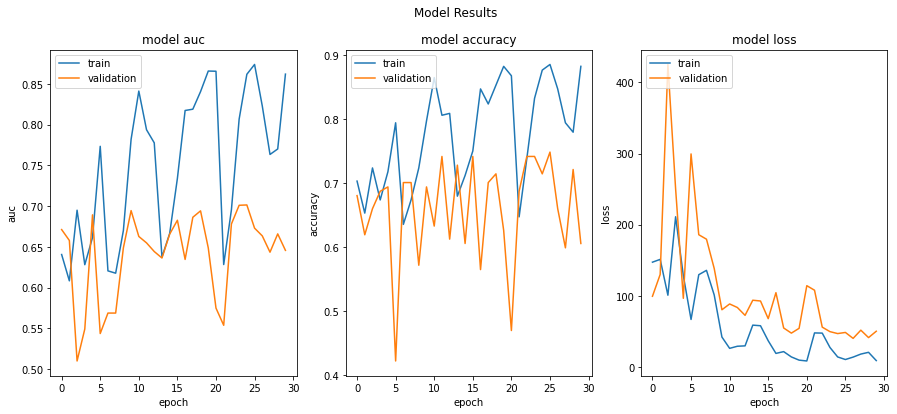

In [10]:
# display the metrics for training the template model
results_viz(history)

Here we can see that the validation AUC peaks at around 0.72, and each of these plots are noisy. We should start by training longer to see where a plateau occurs, but a better validation approach should be taken first

#### Implementing K-fold Cross Validation
Before I go any further, I want to implement cross validation to get the most use out of the training data as the training set is small, and I don't think a holdout set, whether it be 30% or otherwise, will
be the best method to optimize performance

In [11]:
# The following was adapted from the solution in the following article:
# https://medium.com/the-owl/k-fold-cross-validation-in-keras-3ec4a3a00538

from sklearn.model_selection import StratifiedKFold

# used to dynamically save the model name based on the fold
def get_model_name(x):
    return 'model_'+str(x)+'.h5'

# method that takes a defined model and hyperparameter values as parameters for efficient tuning
def cv(model, num_epochs, batch, lr=0.001):
  # keep track of auc, binary accuracy, and loss for each fold
  fold_auc = []
  fold_accuracy = []
  fold_loss = []

  # save the best models in each fold to a new location on my google drive
  save_dir = '/content/saved_models/'
  fold = 1 # counter

  # using stratified k fold as it ensures each fold has the same portion of each label
  skf = StratifiedKFold(n_splits = 5, random_state = 42, shuffle = True)

  # loop to train each fold, since we're doing 5-fold, we train on 80:20 splits
  for tr_idx, val_idx in skf.split(x_train, y_train):

    # feature splits for training and validation
    x_t = x_train[tr_idx]
    x_v = x_train[val_idx]
    
    # label splits for training and validation
    y_t = y_train[tr_idx]
    y_v = y_train[val_idx]

    # compile model (same loss, optimizer, and metrics as in template)
    model.compile(loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
            metrics=['BinaryAccuracy', 'AUC'])
    
    # define callbacks to use checkpoints and early stopping
    
    # checkpoints are useful so we don't save the weights of a model that performs worse 
    mc = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(fold), 
                monitor='val_auc', verbose=0, 
                save_best_only=True, mode='max')
    
    # for this trial, early stopping hurt performance quite a bit, so commented out
    # I tried patience values of 3-7
    # es = tf.keras.callbacks.EarlyStopping(monitor="val_auc",mode="max", patience = 5,
    #                      verbose = 1,
    #                      restore_best_weights = True)
    callbacks_list = [mc]

    # fit model for this fold using our 80:20 split
    history = model.fit(
      x = x_t,
      y = y_t,
      batch_size=batch,
      epochs=num_epochs,
      callbacks=callbacks_list,
      validation_data=(x_v, y_v),
      verbose=0 # output of each cell is big so I don't want things to look cluttered
    )

    # plot metrics
    results_viz(history)
    
    # load best weights to evaluate performance
    model.load_weights("/content/saved_models/model_"+str(fold)+".h5")
    
    # compute scores for this fold
    scores = model.evaluate(x_v, y_v, verbose=0)
    scores = dict(zip(model.metrics_names,scores))

    # append scores to the list
    fold_auc.append(scores['auc'])
    fold_accuracy.append(scores['binary_accuracy'])
    fold_loss.append(scores['loss'])

    tf.keras.backend.clear_session()

    fold += 1

  print('------------------------------------------------------------------------')
  print('Score per fold')
  for i in range(0, len(fold_auc)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - AUC: {fold_auc[i]} - Accuracy: {fold_accuracy[i]} - Loss: {fold_loss[i]}')
  print('------------------------------------------------------------------------')
  print('Average scores for all folds:')
  print(f'> AUC: {np.mean(fold_auc)} (+- {np.std(fold_auc)})')
  print(f'> Accuracy: {np.mean(fold_accuracy)} (+- {np.std(fold_accuracy)})')
  print(f'> Loss: {np.mean(fold_loss)}')
  print('------------------------------------------------------------------------')


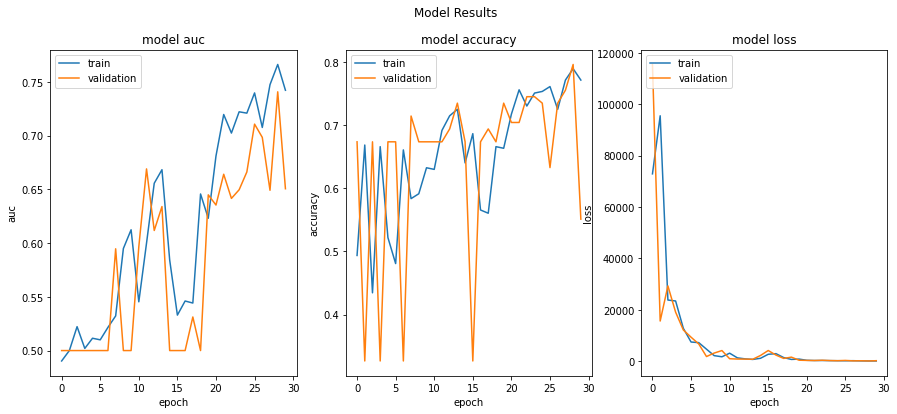

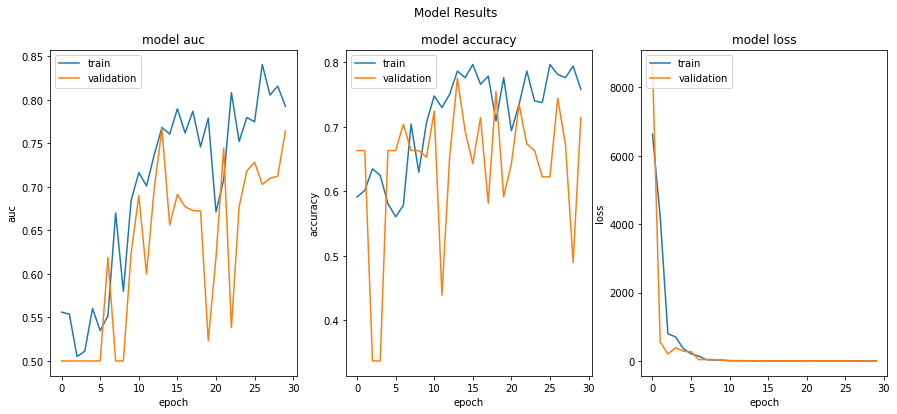

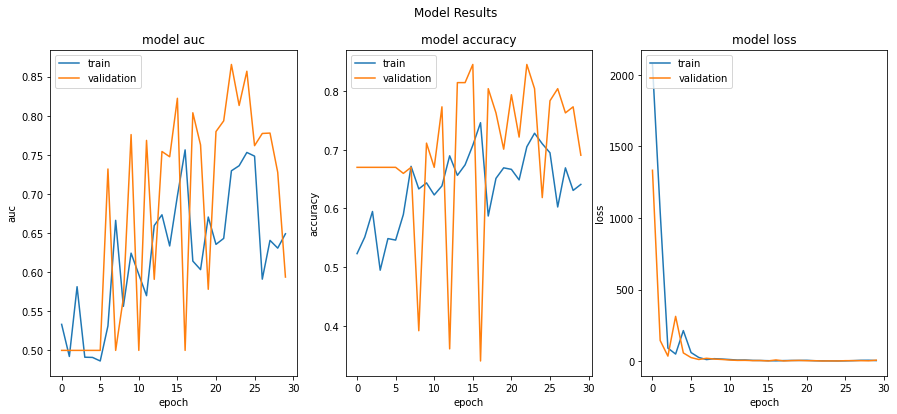

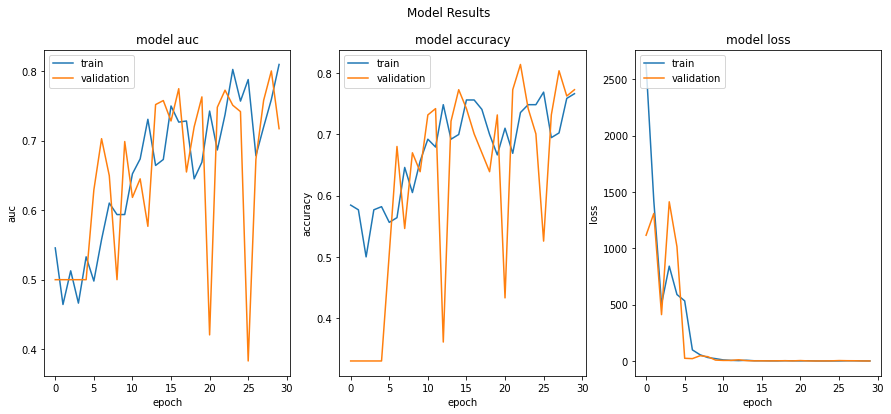

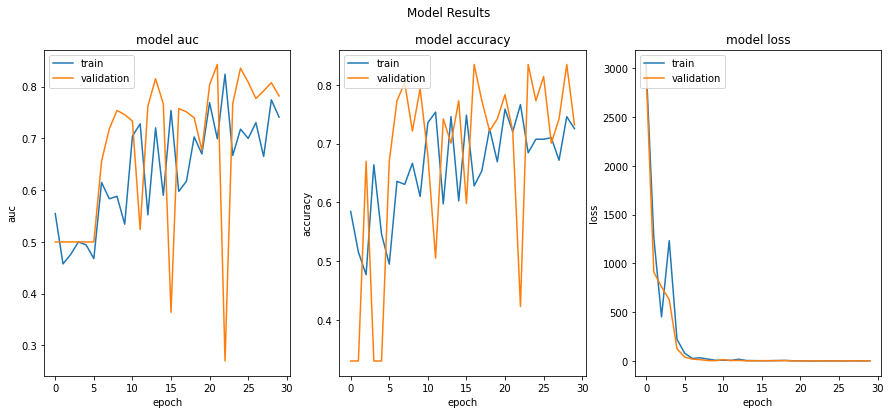

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.7407670021057129 - Accuracy: 0.795918345451355 - Loss: 81.29047393798828
------------------------------------------------------------------------
> Fold 2 - AUC: 0.7671328783035278 - Accuracy: 0.7755101919174194 - Loss: 2.754171371459961
------------------------------------------------------------------------
> Fold 3 - AUC: 0.8656250238418579 - Accuracy: 0.8453608155250549 - Loss: 0.6951207518577576
------------------------------------------------------------------------
> Fold 4 - AUC: 0.7999999523162842 - Accuracy: 0.7628865838050842 - Loss: 1.0559242963790894
------------------------------------------------------------------------
> Fold 5 - AUC: 0.8430289030075073 - Accuracy: 0.7216494679450989 - Loss: 1.2419025897979736
------------------------------------------------------------------------
Average scor

In [12]:
model = build() # re-define the model in the template
cv(model, 30, 64) # train the template model using 5-fold cv with 30 epochs and a batch size of 64

In [13]:
# That took awhile to write, but let's try it out on the test set! 😎
# The best model from the 5-fold cross validation above was fold 1, so I'll load it
model = tf.keras.models.load_model('/content/saved_models/model_5.h5')
test(model, 'trial-1-cross-val.csv')

### Trial 2 - Initial hyperparameter tweaking (number of epochs)
Thoughts and observations from trial 1: 
* cross-validation took awhile to implement now that I'm no longer using sklearn, but after reading enough articles, my implementation does not appear to be uncommon
* The loss curves are smoother
* validation scores for all folds (both auc and accuracy) appear to be much higher than the scores from training the template
* this improved the leaderboard score from ~0.617 to ~0.756, which is a great improvement!

Plan for trial 2: I intend to use the same workflow, but vary the number of epochs to explore any improvement in performance, which is appropriate since the training time isn't too long (yet). The model doesn't appear to be overfitting yet either (training and validation loss keeps decreasing)

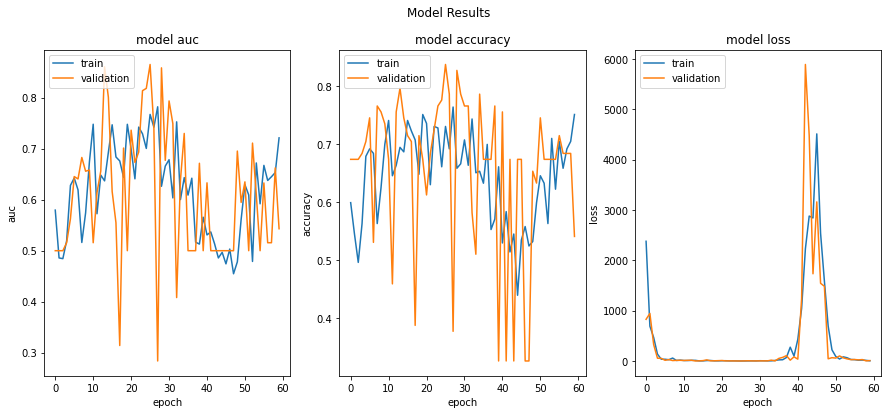

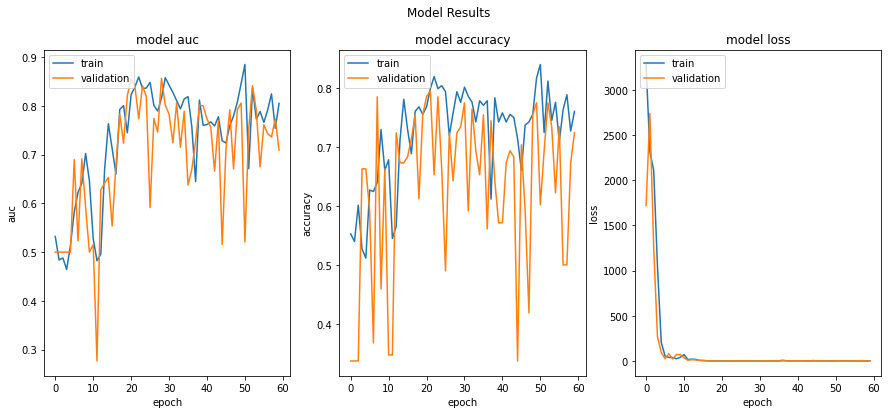

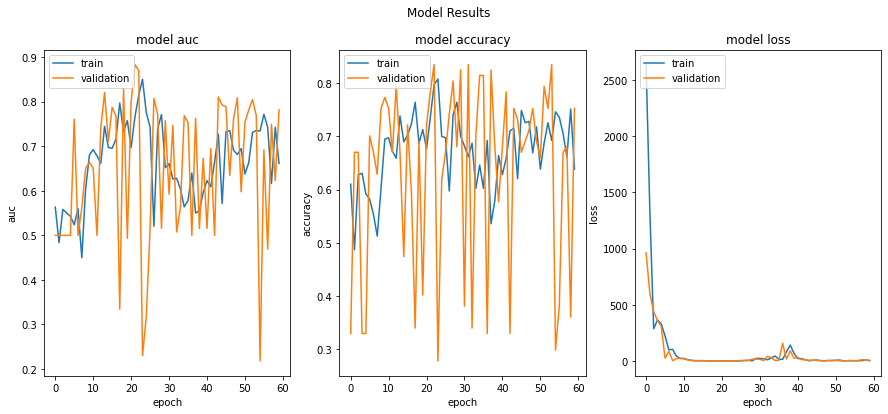

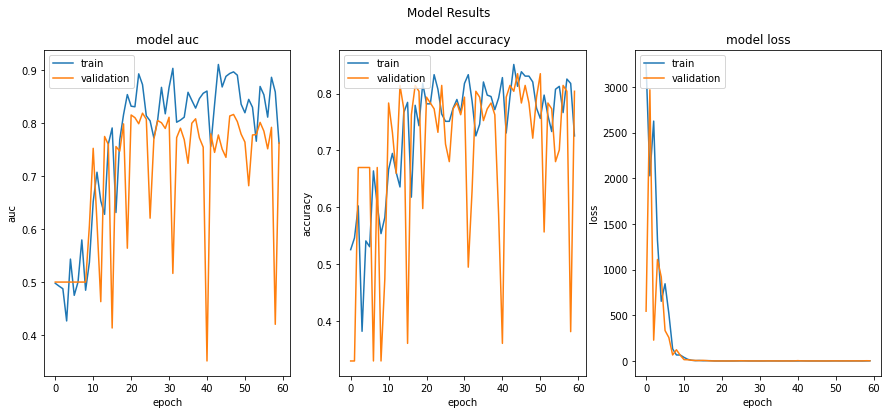

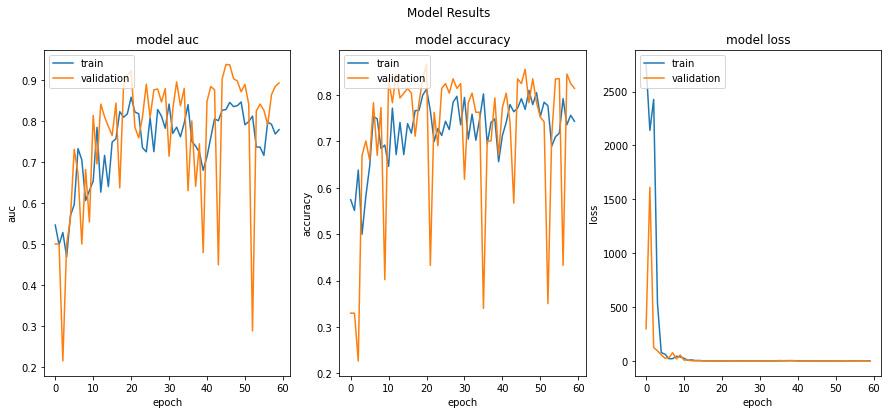

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.8650567531585693 - Accuracy: 0.8367347121238708 - Loss: 0.8185874223709106
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8568764328956604 - Accuracy: 0.7244898080825806 - Loss: 0.6002560257911682
------------------------------------------------------------------------
> Fold 3 - AUC: 0.8836537599563599 - Accuracy: 0.7835051417350769 - Loss: 0.8936154246330261
------------------------------------------------------------------------
> Fold 4 - AUC: 0.8189903497695923 - Accuracy: 0.7319587469100952 - Loss: 1.0929999351501465
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9377403259277344 - Accuracy: 0.8247422575950623 - Loss: 0.4396129846572876
------------------------------------------------------------------------
Average s

In [14]:
# using the same model architecture, trying twice as many epochs
cv(model, 60, 64)

In [15]:
model = tf.keras.models.load_model('/content/saved_models/model_5.h5')
test(model, 'trial-2-cross-val.csv')

This scored 0.80158 on the public leaderboard, and I haven't even touched the model architecture yet! This is great! 🔥🔥🔥

I'll double the number of epochs one last time before moving onto trial 3 to see if performance continues to improve

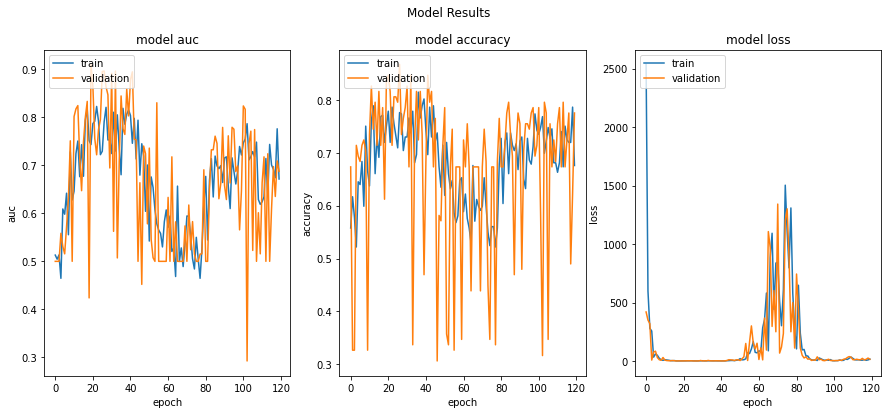

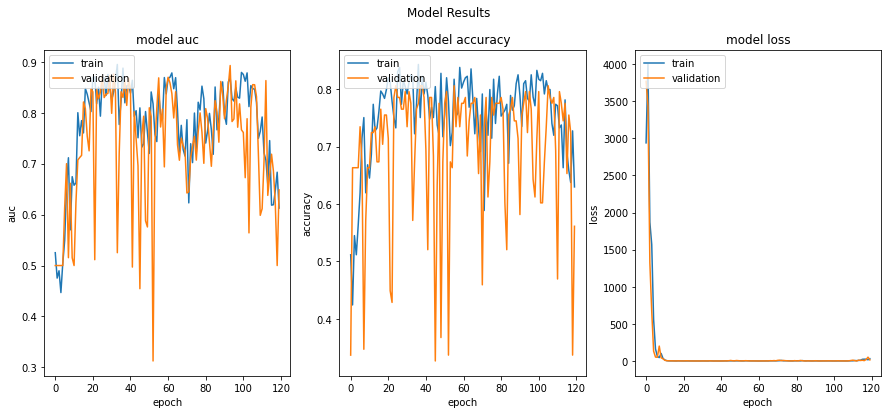

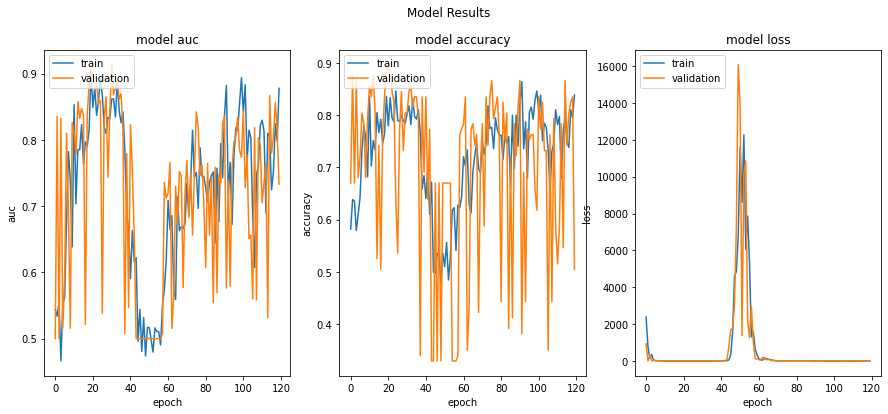

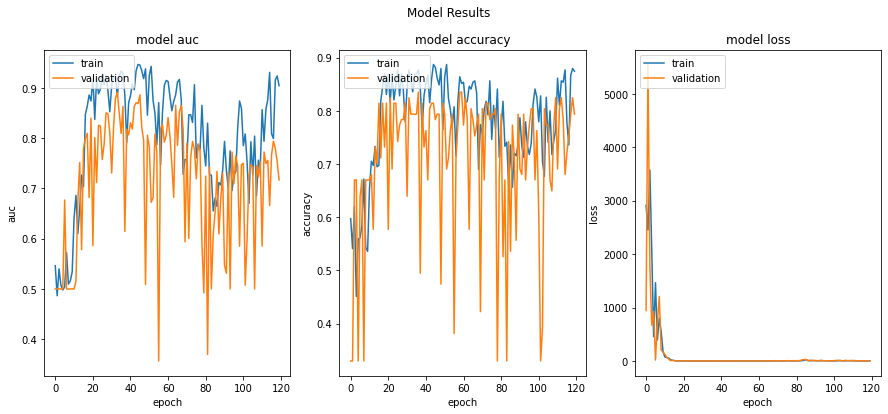

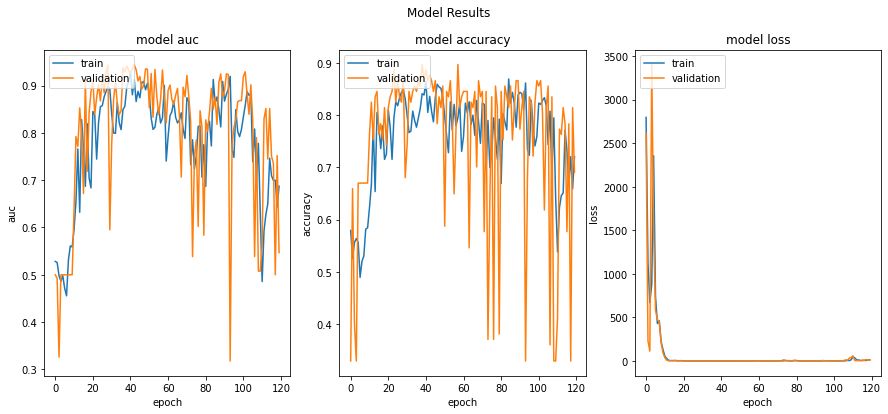

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9102745652198792 - Accuracy: 0.8367347121238708 - Loss: 0.7188684940338135
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8927739858627319 - Accuracy: 0.795918345451355 - Loss: 0.5252726674079895
------------------------------------------------------------------------
> Fold 3 - AUC: 0.9137019515037537 - Accuracy: 0.8041236996650696 - Loss: 0.5306709408760071
------------------------------------------------------------------------
> Fold 4 - AUC: 0.8908652663230896 - Accuracy: 0.7938144207000732 - Loss: 0.4563427269458771
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9447115063667297 - Accuracy: 0.876288652420044 - Loss: 0.33663833141326904
------------------------------------------------------------------------
Average sc

In [16]:
cv(model, 120, 64)

In [17]:
# my average validation AUC has continued to improve, so I'll make another submission,
# this time using the model from fold 1
model = tf.keras.models.load_model('/content/saved_models/model_1.h5')
test(model, 'trial-2-cross-val-120epochs.csv')

This did not improve my leaderboard score, with this submission scoring 0.79751 on the public test set

### Trial 3 - Remaining hyperparameters (batch size and learning rate)
Thoughts and observations from trial 2: 
* Increasing the number of epochs further improved the validation AUC, and also allowed me to explore where the model overfits (around 60-80 epochs for most folds)
* Using model checkpoints is very efficient
* this improved the leaderboard score from ~0.756 to ~0.8, which is a great improvement!

Plan for trial 3: I intend to use the same workflow, but vary the batch size and learning rate to explore any improvement in performance, similar to what I just did with the number of epochs. I'll use 60 epochs moving forward as this is what yielded my best public leaderboard score.

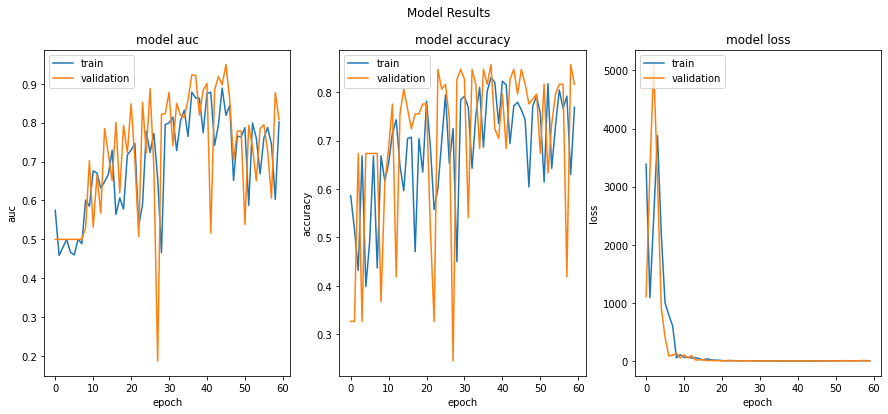

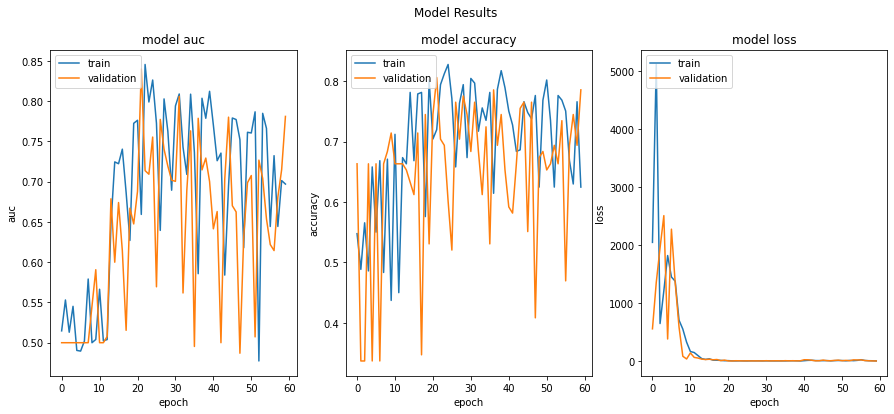

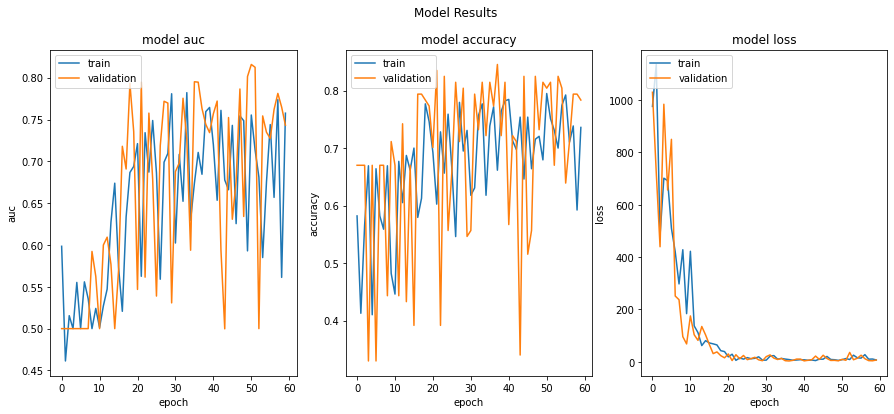

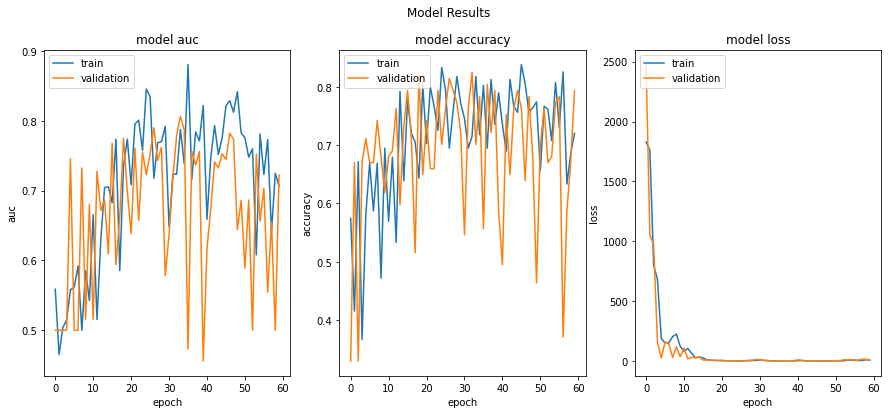

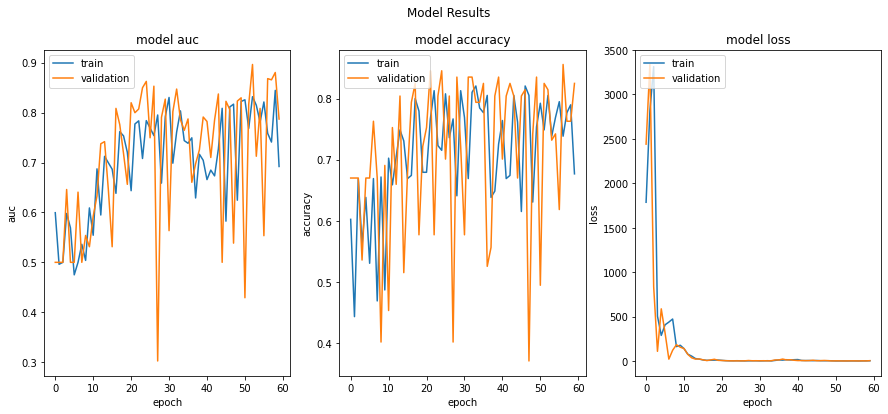

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9495738744735718 - Accuracy: 0.8469387888908386 - Loss: 0.3618897497653961
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8400932550430298 - Accuracy: 0.8061224222183228 - Loss: 1.790743112564087
------------------------------------------------------------------------
> Fold 3 - AUC: 0.8158652782440186 - Accuracy: 0.8041236996650696 - Loss: 9.368571281433105
------------------------------------------------------------------------
> Fold 4 - AUC: 0.8062499761581421 - Accuracy: 0.7010309100151062 - Loss: 1.5310769081115723
------------------------------------------------------------------------
> Fold 5 - AUC: 0.8963942527770996 - Accuracy: 0.8144329786300659 - Loss: 0.9291129112243652
------------------------------------------------------------------------
Average sco

In [18]:
# double batch size, default learning rate of 0.001 still
cv(model, 60, 128) 

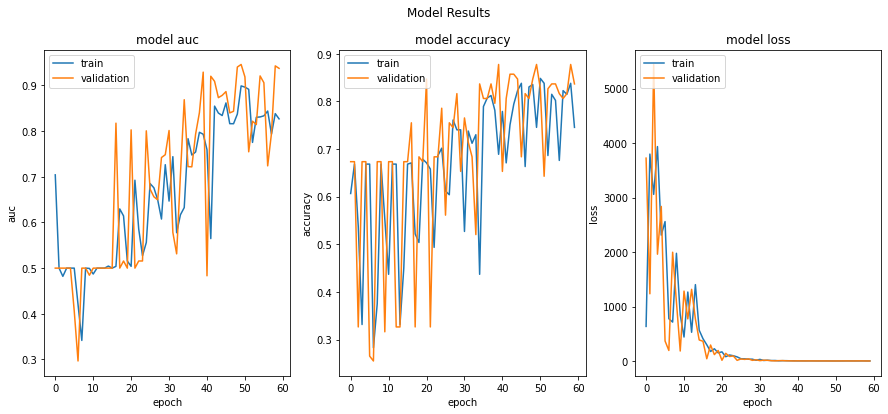

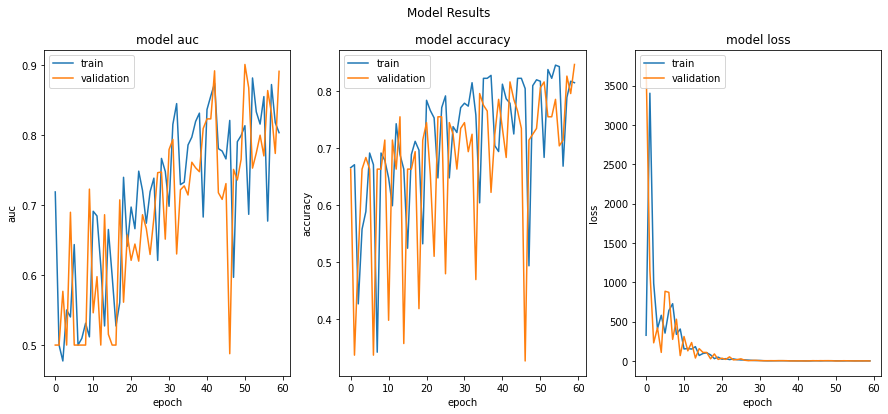

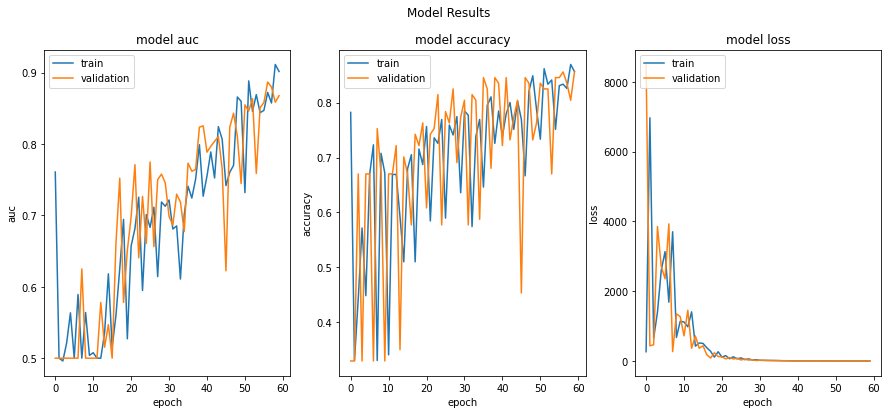

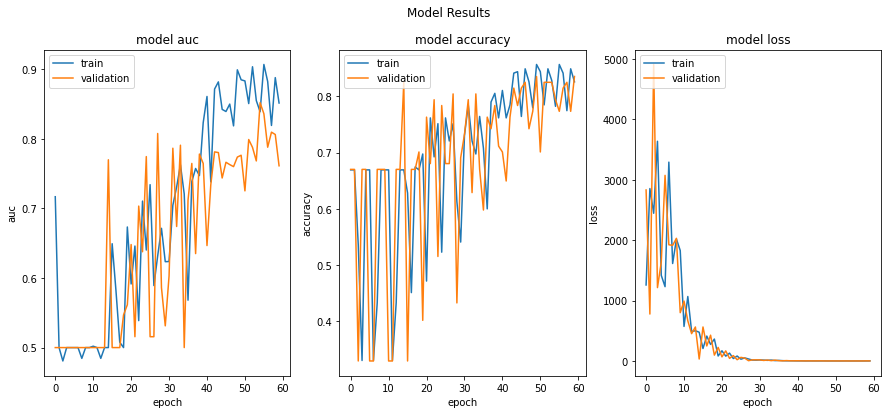

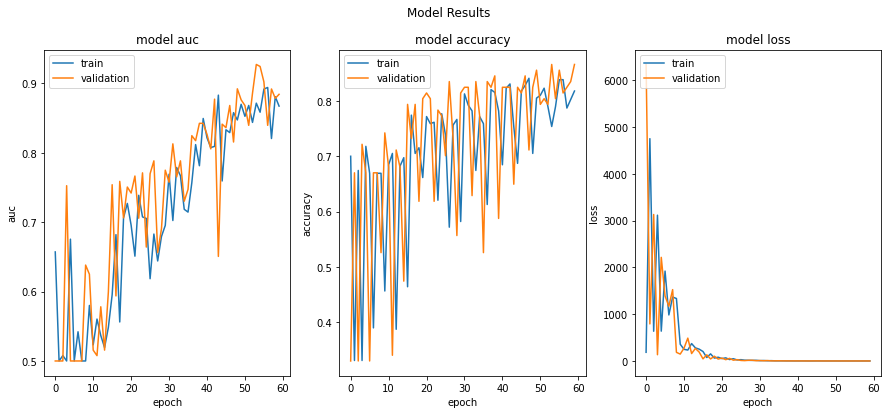

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9460227489471436 - Accuracy: 0.8775510191917419 - Loss: 0.3696821630001068
------------------------------------------------------------------------
> Fold 2 - AUC: 0.9013985395431519 - Accuracy: 0.8061224222183228 - Loss: 0.6937673687934875
------------------------------------------------------------------------
> Fold 3 - AUC: 0.887019157409668 - Accuracy: 0.8556700944900513 - Loss: 0.6414878964424133
------------------------------------------------------------------------
> Fold 4 - AUC: 0.8519231081008911 - Accuracy: 0.7938144207000732 - Loss: 0.8976422548294067
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9274037480354309 - Accuracy: 0.8659793734550476 - Loss: 0.4351615905761719
------------------------------------------------------------------------
Average sc

In [19]:
# validation AUC is similar to before with an average of ~0.88
# doubling batch size again, default learning rate of 0.001 still
cv(model, 60, 256) 

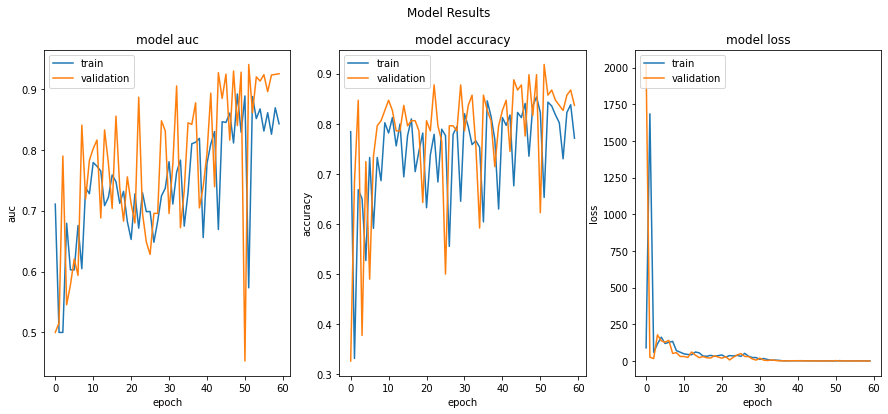

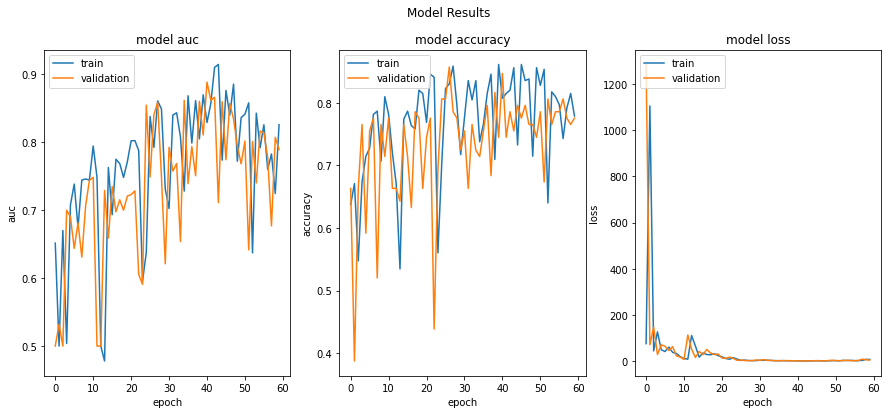

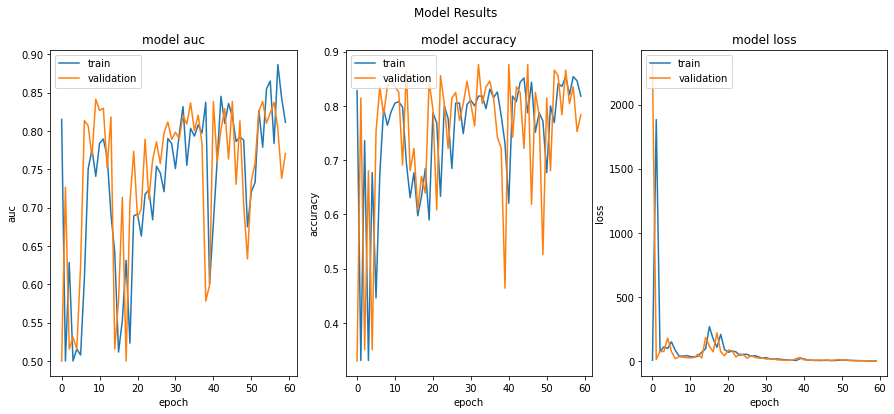

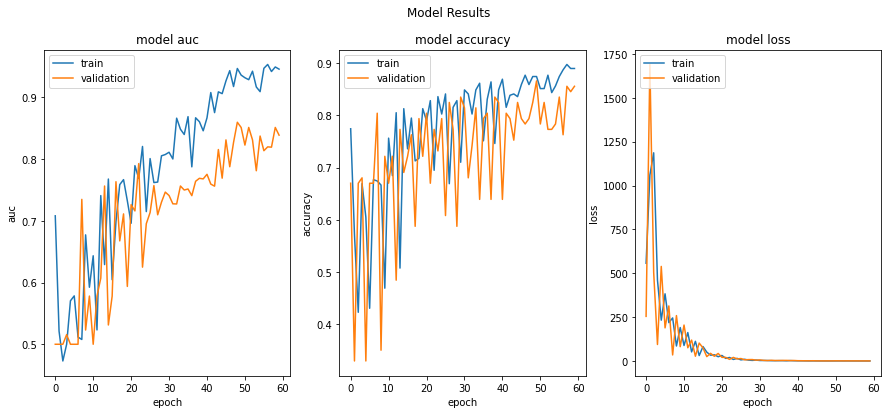

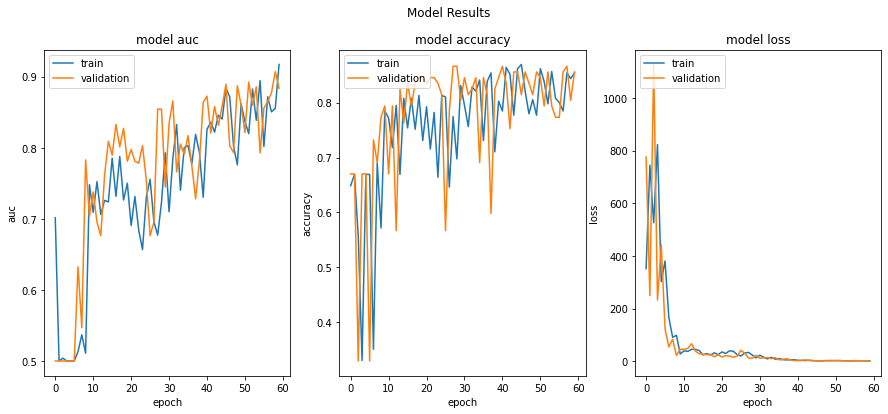

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9401041269302368 - Accuracy: 0.918367326259613 - Loss: 0.5982761383056641
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8885780572891235 - Accuracy: 0.8469387888908386 - Loss: 0.5968350172042847
------------------------------------------------------------------------
> Fold 3 - AUC: 0.8413461446762085 - Accuracy: 0.8453608155250549 - Loss: 27.161882400512695
------------------------------------------------------------------------
> Fold 4 - AUC: 0.8598557710647583 - Accuracy: 0.8247422575950623 - Loss: 0.8958958983421326
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9072116017341614 - Accuracy: 0.8041236996650696 - Loss: 1.3860275745391846
------------------------------------------------------------------------
Average sc

In [20]:
# That's a slight improvement. Let's see what happens if I halve the learning rate
cv(model, 60, 256, 0.0005) 

looks like this is overfitting, trying a few more configurations

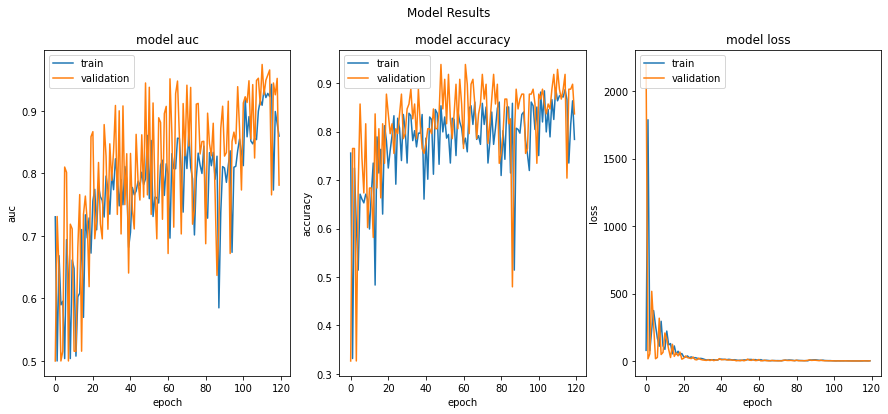

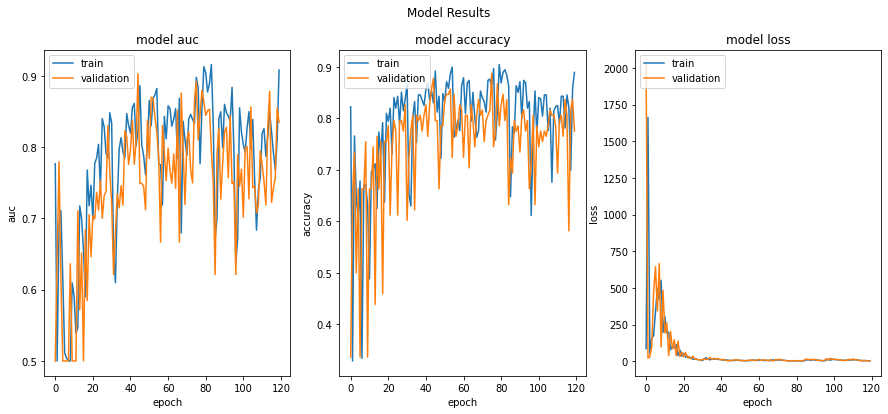

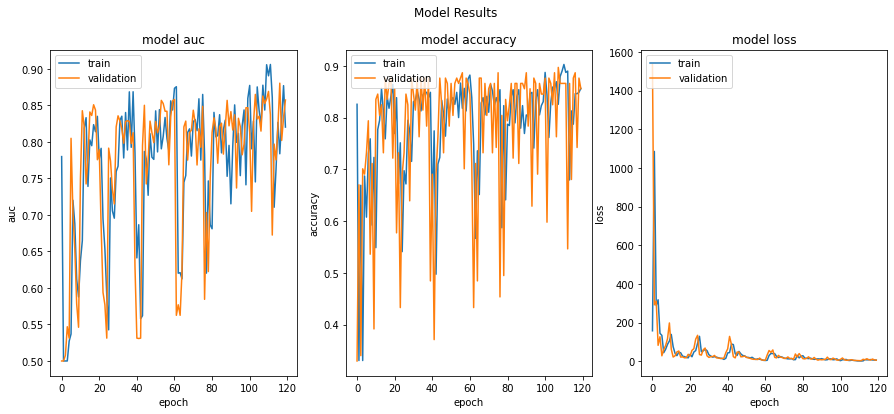

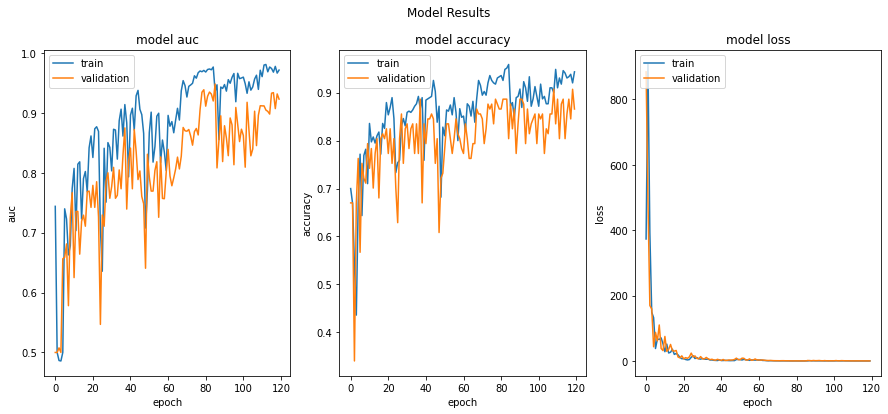

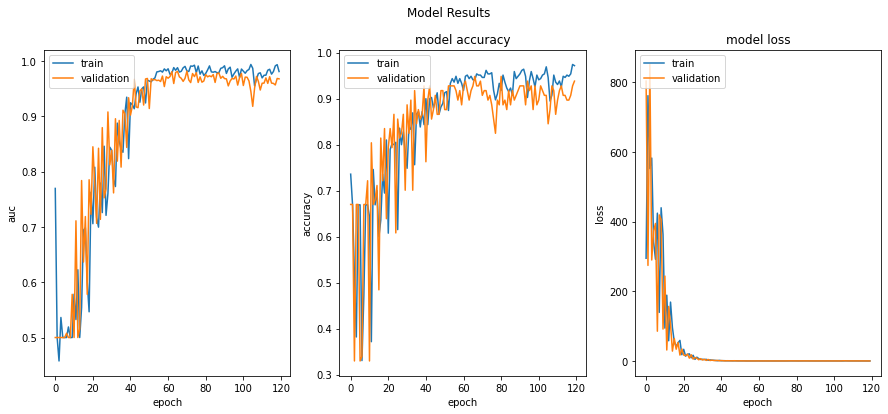

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9741950631141663 - Accuracy: 0.9285714030265808 - Loss: 0.22074732184410095
------------------------------------------------------------------------
> Fold 2 - AUC: 0.903030276298523 - Accuracy: 0.8775510191917419 - Loss: 2.2563750743865967
------------------------------------------------------------------------
> Fold 3 - AUC: 0.8802884817123413 - Accuracy: 0.8865979313850403 - Loss: 6.787149429321289
------------------------------------------------------------------------
> Fold 4 - AUC: 0.948317289352417 - Accuracy: 0.876288652420044 - Loss: 0.37967273592948914
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9817307591438293 - Accuracy: 0.907216489315033 - Loss: 0.1813078671693802
------------------------------------------------------------------------
Average scor

In [21]:
cv(model, 120, 256, 0.0005) 

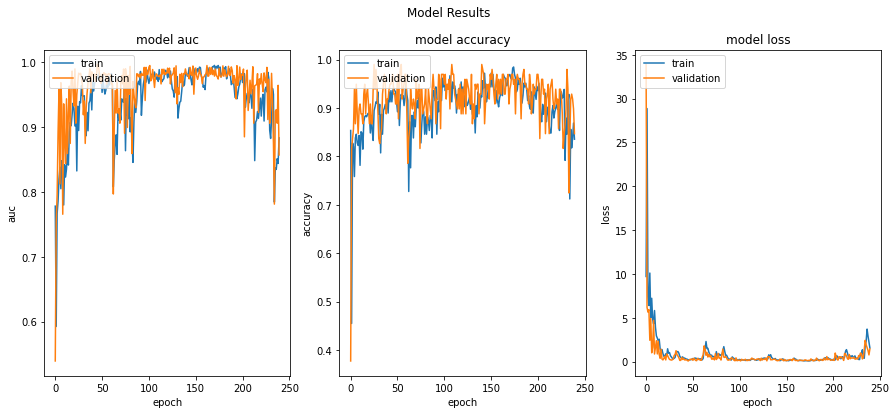

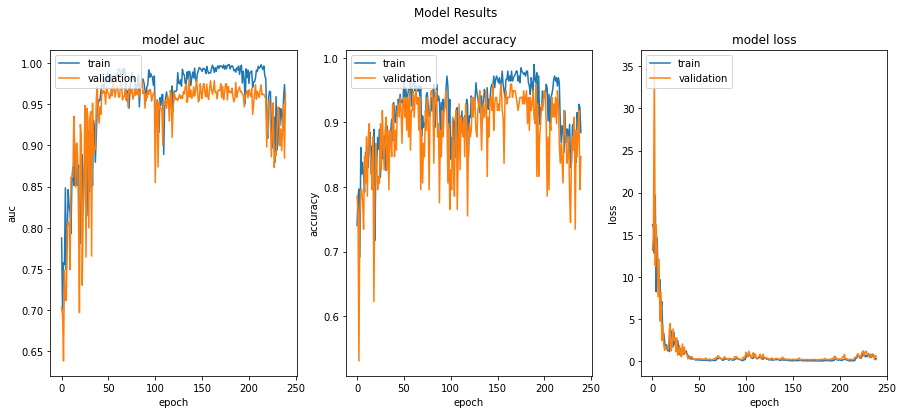

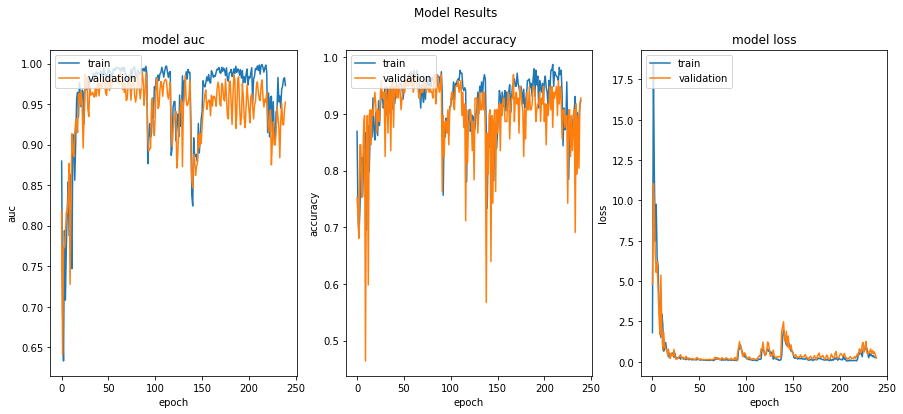

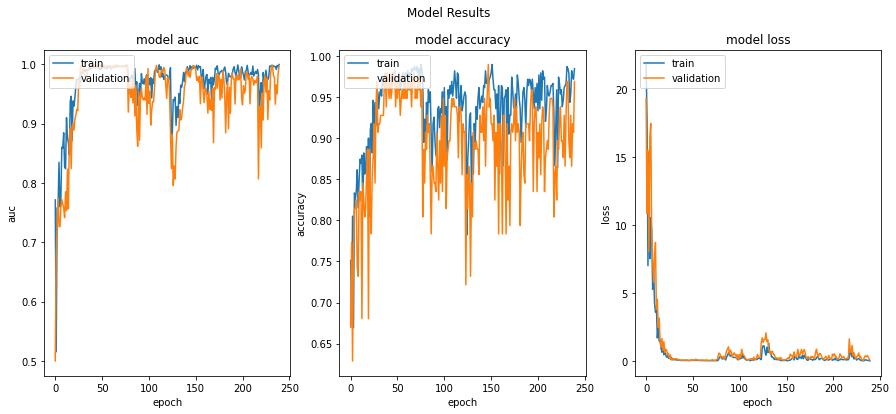

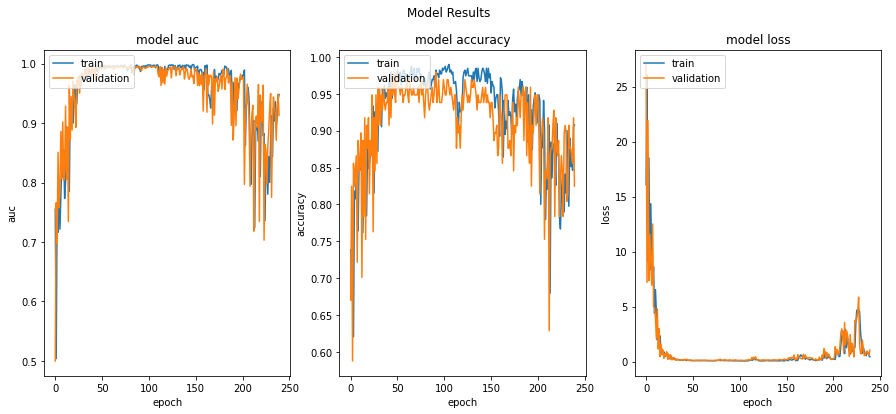

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9969223141670227 - Accuracy: 0.9693877696990967 - Loss: 0.06933371722698212
------------------------------------------------------------------------
> Fold 2 - AUC: 0.98111891746521 - Accuracy: 0.9081632494926453 - Loss: 0.25173503160476685
------------------------------------------------------------------------
> Fold 3 - AUC: 0.9896634817123413 - Accuracy: 0.969072163105011 - Loss: 0.10472171008586884
------------------------------------------------------------------------
> Fold 4 - AUC: 0.9995192289352417 - Accuracy: 0.9793814420700073 - Loss: 0.06658142805099487
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9966346025466919 - Accuracy: 0.9793814420700073 - Loss: 0.08099759370088577
------------------------------------------------------------------------
Average

In [22]:
cv(model, 240, 256, 0.0001) 

In [23]:
# I think we're finally overfitting (one of the folds had a validation AUC of 1.0)
model = tf.keras.models.load_model('/content/saved_models/model_4.h5')
test(model, 'trial-3-cross-val-tuned-params.csv')

### Trial 4 - adjusting fully-connected architecture with dropout layers
Thoughts and observations from trial 3: 
* Varying hyperparameters with for the fully connected model finally reached a point where it overfits. The best configuration appears to be 80 epochs, batch size 256, and a learning rate of 0.0005. However, I am concerned that this configuration results in overfitting.

Plan for trial 4: Using the data science life cycle for tuning, I believe I have overfit to the development set, resulting in decreasing performance on the test split. I also believe that my performance with this model architecture has reached a plateau, so I will try making a small change to the fully-connected architecture now by adding dropout layers

In [24]:
def build_new_fc(): # method used to build a fully-connected network
    img_in = Input(shape=(256, 256, 2)) # shape of our input images, 256x256 pixels, and 2 channels since grayscale
    flattened = Flatten()(img_in) # flattening the input for each sample into a 1D shape 256x256x2 = 131072 
    fc1 = Dense(64)(flattened) # dense layer of 64 neurons on top of the flattened input
    fc1 = Dropout(0.3)(fc1) # <-- dropout layer with a probability of 30%, could be used to prevent overfitting in deep networks
    fc2 = Dense(32)(fc1) # dense layer of 32 neurons
    fc2 = Dropout(0.3)(fc2) # <-- another dropout layer, see above
    output = Dense(1, activation = 'sigmoid')(fc2) # output layer used to make predictions
    model = tf.keras.Model(inputs=img_in, outputs=output) # assigning the model
    return model

new_model = build_new_fc()

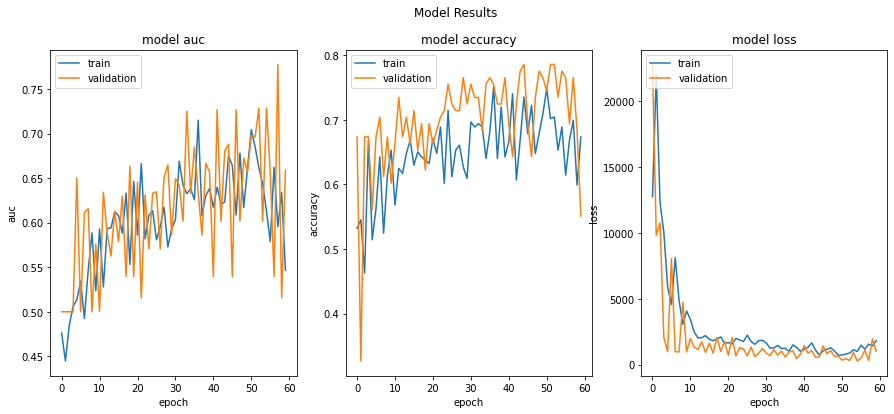

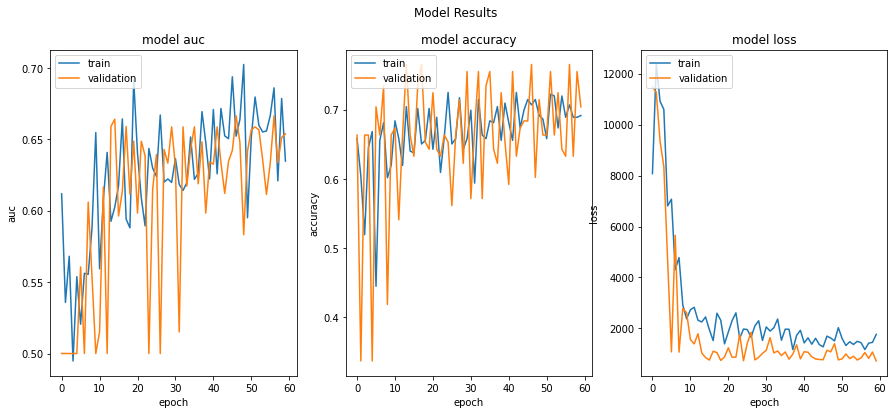

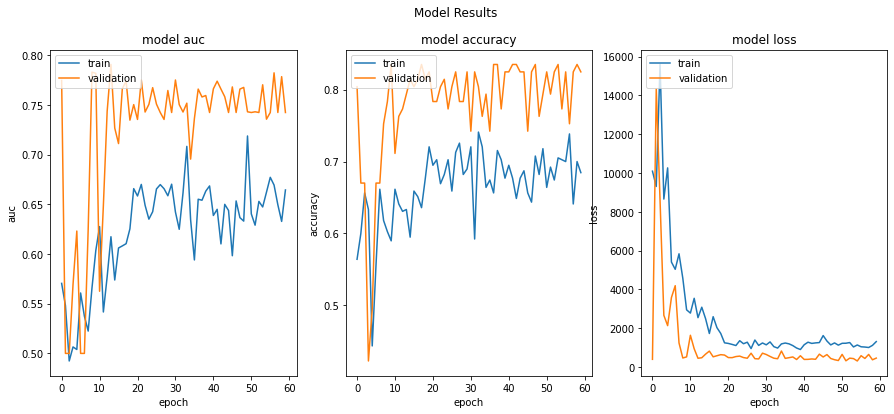

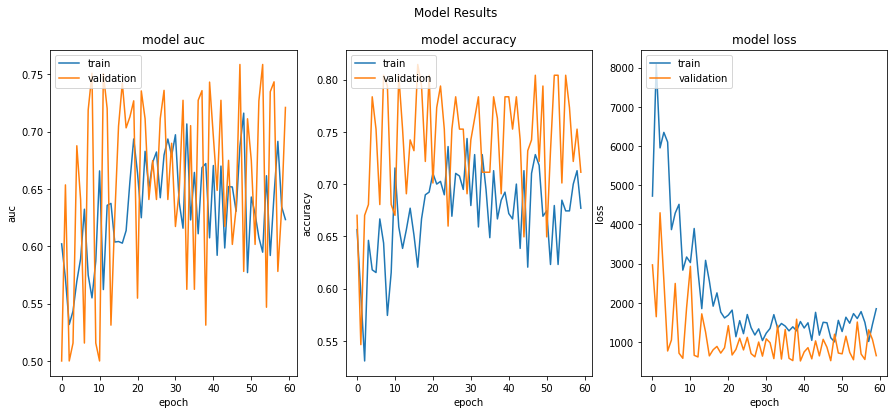

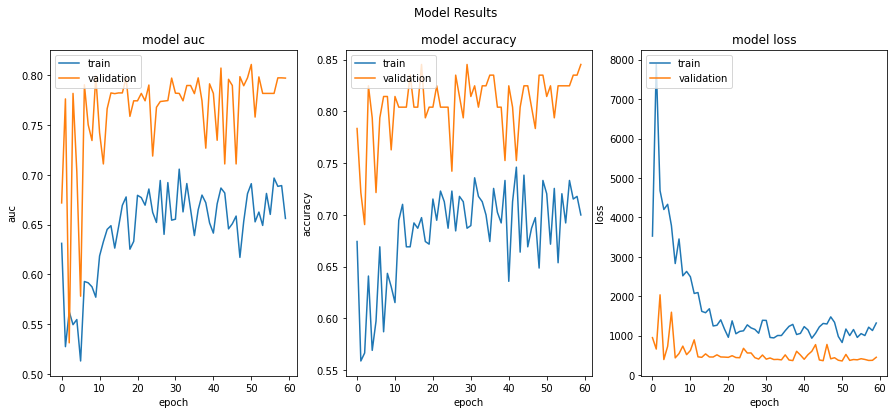

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.7774621248245239 - Accuracy: 0.7653061151504517 - Loss: 326.6227111816406
------------------------------------------------------------------------
> Fold 2 - AUC: 0.666433572769165 - Accuracy: 0.7653061151504517 - Loss: 1141.951416015625
------------------------------------------------------------------------
> Fold 3 - AUC: 0.7906249761581421 - Accuracy: 0.7938144207000732 - Loss: 475.7640686035156
------------------------------------------------------------------------
> Fold 4 - AUC: 0.7586538195610046 - Accuracy: 0.8041236996650696 - Loss: 523.7374267578125
------------------------------------------------------------------------
> Fold 5 - AUC: 0.8110576868057251 - Accuracy: 0.8144329786300659 - Loss: 357.5736999511719
------------------------------------------------------------------------
Average scores 

In [25]:
# using the same hyperparameters from before with a different fully-connected 
# architecture that uses dropout
cv(new_model, 60, 256, 0.0005)

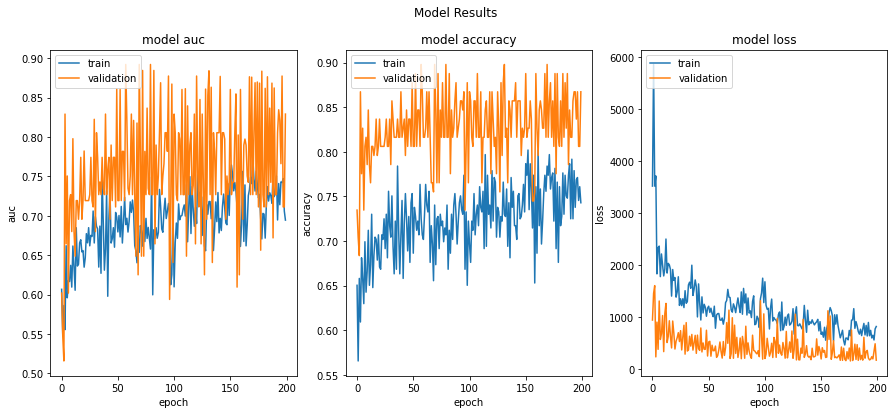

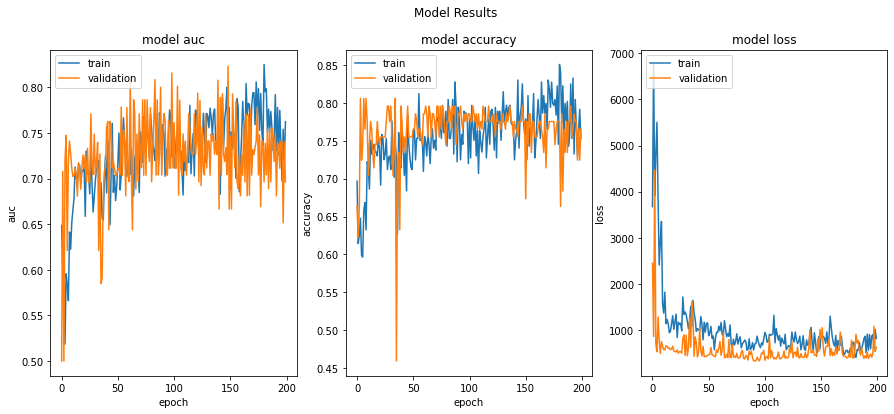

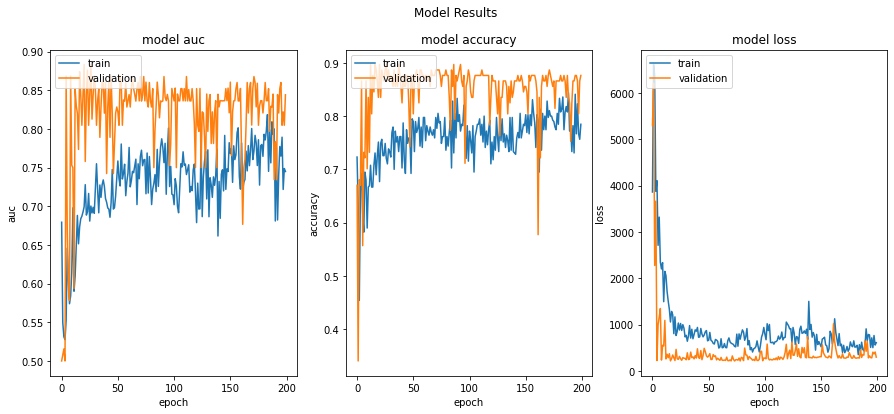

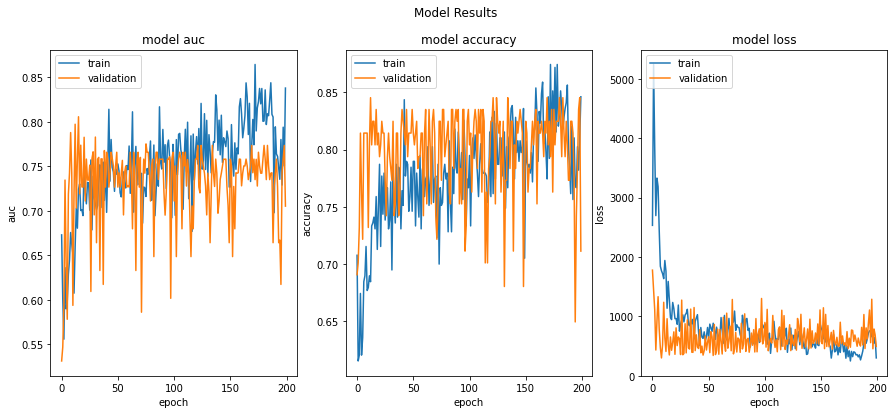

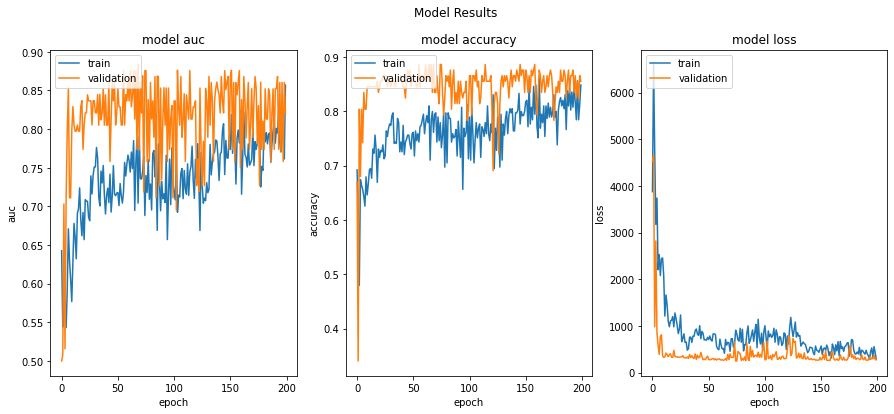

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.8920454978942871 - Accuracy: 0.8979591727256775 - Loss: 230.92396545410156
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8233100175857544 - Accuracy: 0.7755101919174194 - Loss: 542.7710571289062
------------------------------------------------------------------------
> Fold 3 - AUC: 0.8834134340286255 - Accuracy: 0.8969072103500366 - Loss: 222.16055297851562
------------------------------------------------------------------------
> Fold 4 - AUC: 0.8057692050933838 - Accuracy: 0.8247422575950623 - Loss: 350.7268371582031
------------------------------------------------------------------------
> Fold 5 - AUC: 0.8836538791656494 - Accuracy: 0.8865979313850403 - Loss: 279.7665100097656
------------------------------------------------------------------------
Average scor

In [26]:
# running for 200 epochs to see where we overfit
cv(new_model, 200, 256, 0.0005)

In [27]:
# getting our predictions for this trial
model = tf.keras.models.load_model('/content/saved_models/model_1.h5')
test(model, 'trial-4-dropout.csv')

### Trial 5 - Finalizing fully-connected architecture with by adding depth
Thoughts and observations from trial 4: 
* Dropout reduces performance, but training for longer improves the average AUC, without the apparent overfitting from trial 3. Let's see what happens if I use a deeper network

Plan for trial 5: I will try adding depth to the fully-connected architecture now by adding alternating dense and dropout layers

In [28]:
# method used to build a fully-connected network
def build_deep_fc():
    img_in = Input(shape=(256, 256, 2))
    flattened = Flatten()(img_in)
    
    # alternating dense layers iteratively shrinking in size with dropout in between
    # I kept increasing the number of layers to explore the impact on performance
    # and gave up after 7 because it was taking awhile to train, results in subsequent cells
    fc1 = Dense(256)(flattened)
    fc1 = Dropout(0.25)(fc1)
    fc2 = Dense(128)(fc1)
    fc2 = Dropout(0.25)(fc2)
    fc3 = Dense(64)(fc2)
    fc3 = Dropout(0.25)(fc3)
    fc4 = Dense(32)(fc3)
    fc4 = Dropout(0.25)(fc4)
    fc5 = Dense(16)(fc4)
    fc5 = Dropout(0.25)(fc5)
    fc6 = Dense(8)(fc5)
    fc6 = Dropout(0.25)(fc6)
    fc7 = Dense(4)(fc6)
    fc7 = Dropout(0.25)(fc7)

    output = Dense(1, activation = 'sigmoid')(fc7)
    model = tf.keras.Model(inputs=img_in, outputs=output)
    return model

deep_model = build_deep_fc() # define the model
deep_model.summary() # print a summary of the model

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 2)]     0         
_________________________________________________________________
flatten (Flatten)            (None, 131072)            0         
_________________________________________________________________
dense (Dense)                (None, 256)               33554688  
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256  

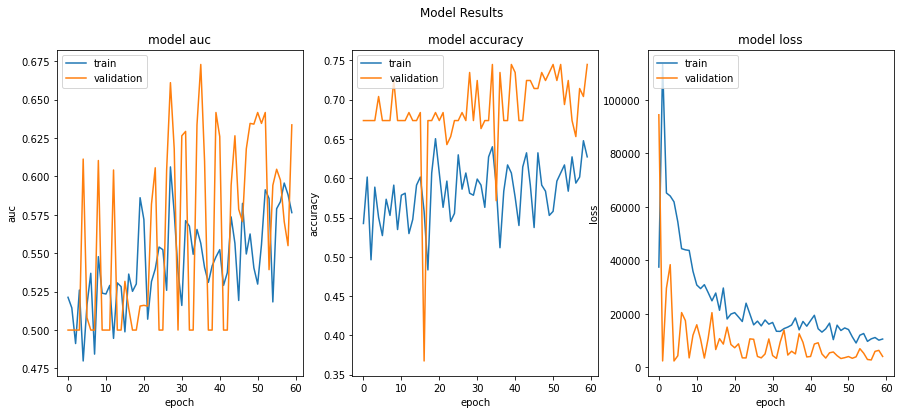

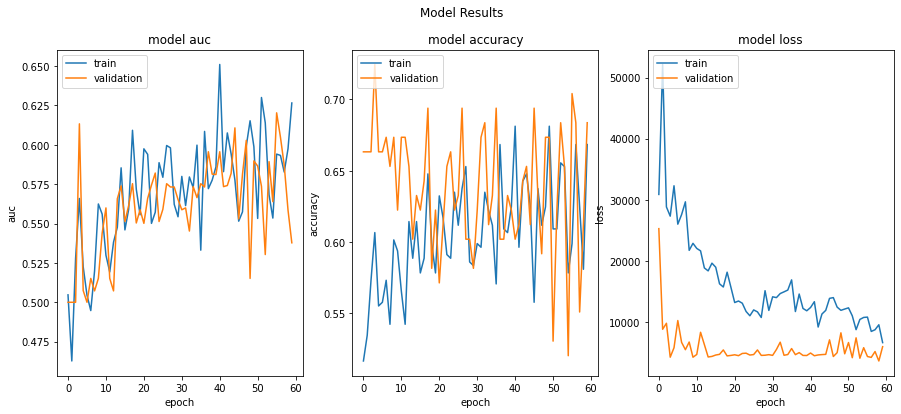

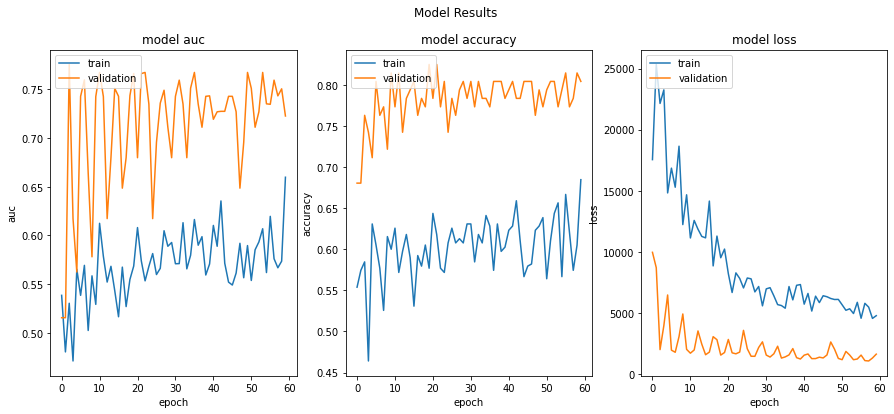

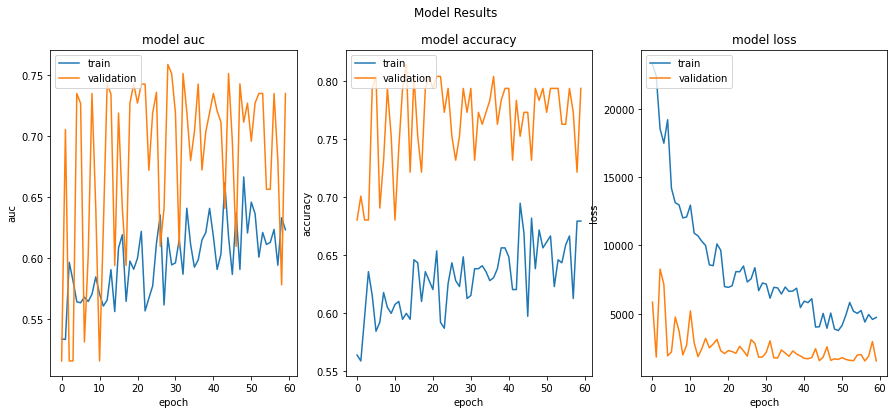

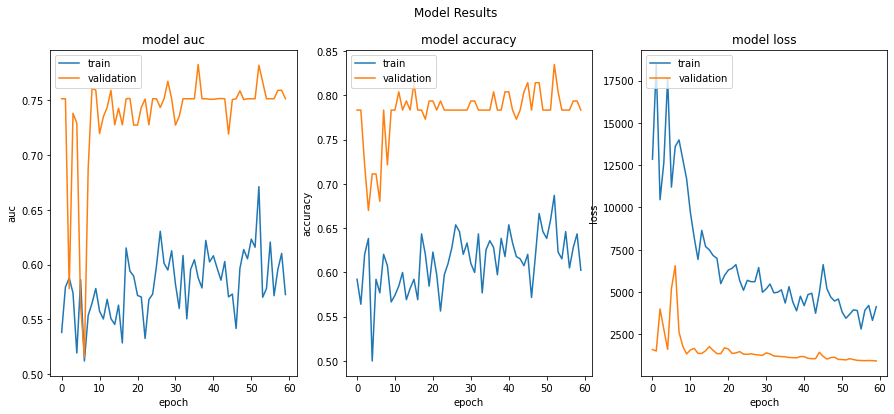

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.6728219985961914 - Accuracy: 0.5714285969734192 - Loss: 5987.73828125
------------------------------------------------------------------------
> Fold 2 - AUC: 0.6202797293663025 - Accuracy: 0.704081654548645 - Loss: 4356.6826171875
------------------------------------------------------------------------
> Fold 3 - AUC: 0.7754807472229004 - Accuracy: 0.7628865838050842 - Loss: 2002.1182861328125
------------------------------------------------------------------------
> Fold 4 - AUC: 0.7588942050933838 - Accuracy: 0.7938144207000732 - Loss: 1824.2716064453125
------------------------------------------------------------------------
> Fold 5 - AUC: 0.7824519276618958 - Accuracy: 0.8041236996650696 - Loss: 1130.4649658203125
------------------------------------------------------------------------
Average scores for

In [29]:
cv(deep_model, 60, 256, 0.0005)

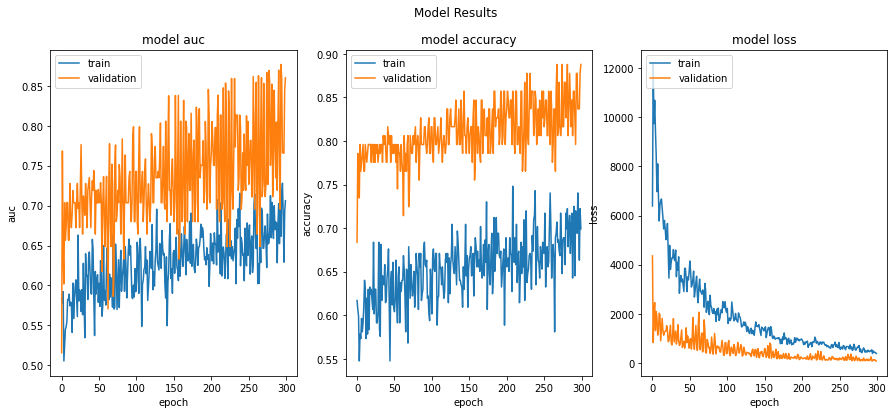

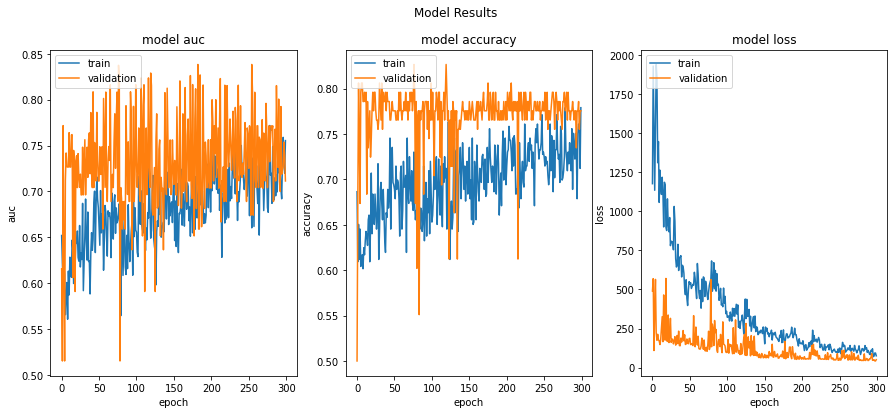

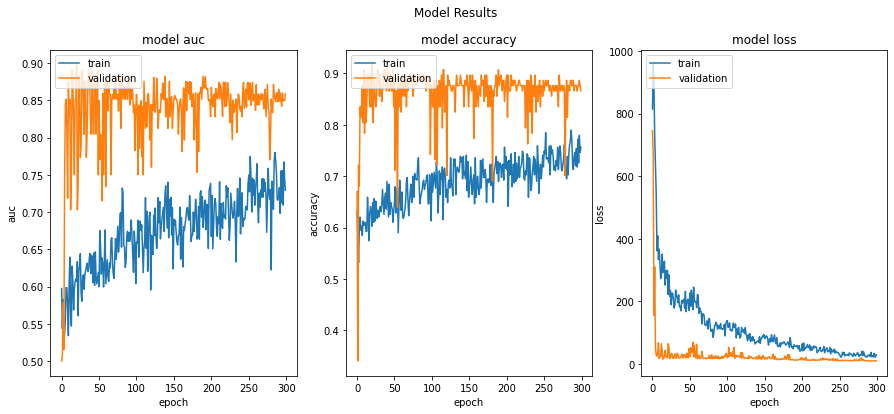

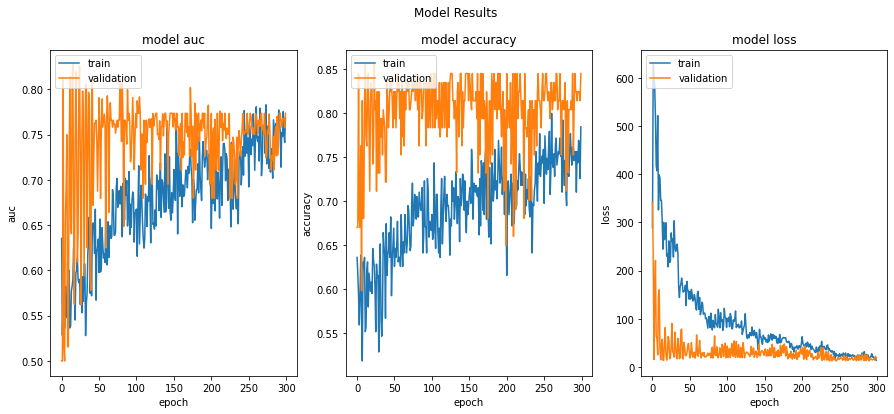

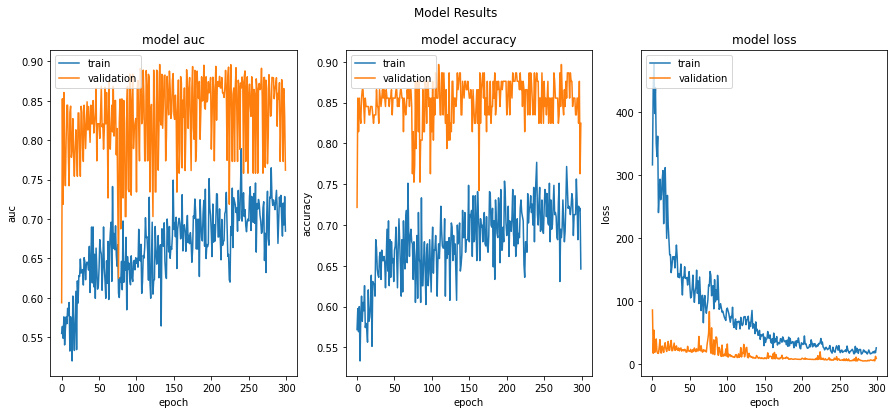

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.876893937587738 - Accuracy: 0.8775510191917419 - Loss: 87.12543487548828
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8384616374969482 - Accuracy: 0.795918345451355 - Loss: 80.14205169677734
------------------------------------------------------------------------
> Fold 3 - AUC: 0.898317277431488 - Accuracy: 0.9175257682800293 - Loss: 19.03841781616211
------------------------------------------------------------------------
> Fold 4 - AUC: 0.8274038434028625 - Accuracy: 0.8453608155250549 - Loss: 13.754847526550293
------------------------------------------------------------------------
> Fold 5 - AUC: 0.8961538672447205 - Accuracy: 0.8556700944900513 - Loss: 12.717289924621582
------------------------------------------------------------------------
Average scores 

In [30]:
# This is very lossy, noisy, and does not appear to converge, so I'll try training for longer:
cv(deep_model, 300, 256, 0.0005)

In [31]:
# I hope we aren't overfitting again, but I fear we might be, using the model from the best fold above:
model = tf.keras.models.load_model('/content/saved_models/model_5.h5')
test(model, 'trial-5-tuned-fcnn.csv')

## Next set of trials: Adding data augmentation to fully connected model
* Again, since we're working with a small dataset, the model would benefit from being trained on more data.
* Working with images makes it easier to conceptualize data augmentation, as we can make transformations to the input image to create new samples, which are still representative of the original images. 
* I will follow the tutorial linked in the assignment outline (https://www.tensorflow.org/tutorials/images/data_augmentation#use_keras_preprocessing_layers) to flip and rotate original samples to augment the volume of training data the model has available to it.

### Trial 6 - Data Augmentation
Thoughts and observations from trial 5: 
* leaderboard score did not improve, and any model architecture just overfits to the dev/val set once it's trained long enough to converge
* I've tried tuning the hyperparameters and model architecture, and I believe the next way to improve my performance using the data science life cycle for tuning is with more training/dev data (since the error on the public leaderboard is increasing)!
* My best public leaderboard score remains at ~0.8 

Plan for trial 6: I'll use a consistent fully-connected architecture for this trial, but I will augment the training set so the model can generalize better to the validation and test splits

In [32]:
# import dependencies for data augmentation
from tensorflow.keras.layers import RandomFlip, RandomRotation, Rescaling

# keras layer used to rescale image values
scaling = tf.keras.Sequential([
  Rescaling(1./255)
])

augmentation = tf.keras.Sequential([
  RandomFlip("horizontal_and_vertical"),
  RandomRotation(0.2), # random rotation hurt performance in my experience
])

# same architecture as in the template, just written a different way
model_t5 = tf.keras.Sequential([
  Input(shape=(256, 256, 2)),
  scaling,
  augmentation,
  Flatten(),
  Dense(64),
  Dense(32),
  Dense(1, activation='sigmoid')
])

model_t5.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 256, 256, 2)       0         
_________________________________________________________________
sequential_1 (Sequential)    (None, 256, 256, 2)       0         
_________________________________________________________________
flatten (Flatten)            (None, 131072)            0         
_________________________________________________________________
dense (Dense)                (None, 64)                8388672   
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 33        
Total params: 8,390,785
Trainable params: 8,390,785
Non-trainable params: 0
____________________________________________

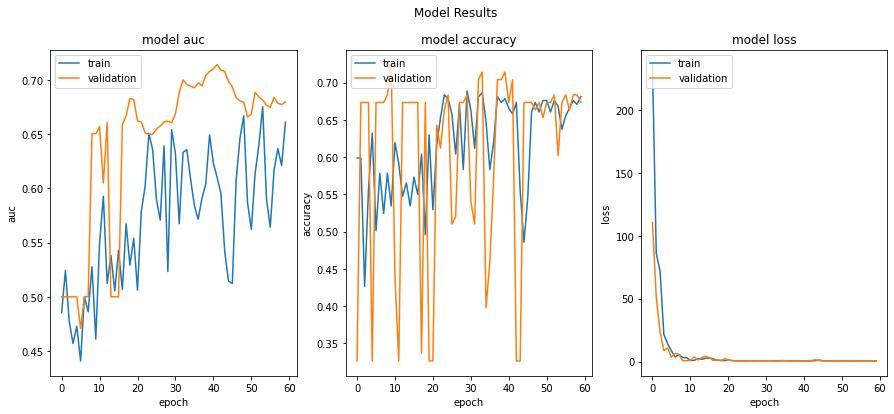

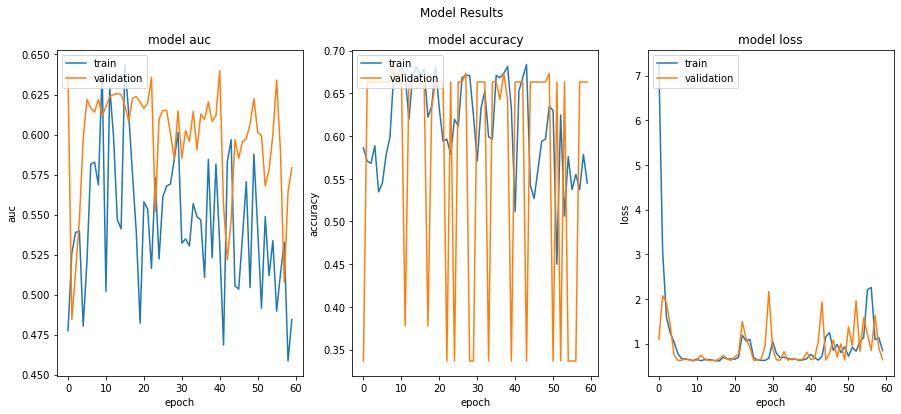

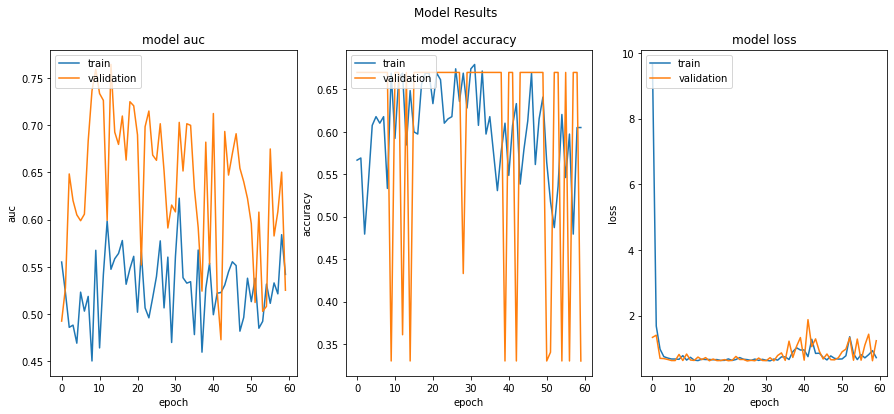

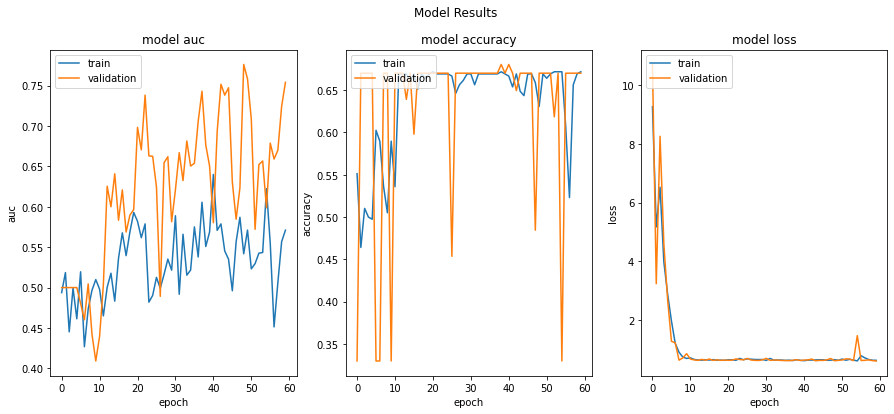

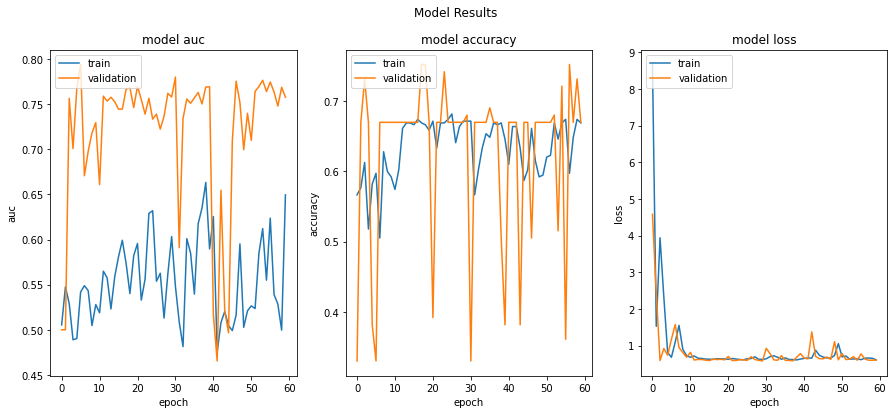

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.7142518758773804 - Accuracy: 0.704081654548645 - Loss: 0.6070521473884583
------------------------------------------------------------------------
> Fold 2 - AUC: 0.6398601531982422 - Accuracy: 0.6632652878761292 - Loss: 0.6484843492507935
------------------------------------------------------------------------
> Fold 3 - AUC: 0.7641826868057251 - Accuracy: 0.6701030731201172 - Loss: 0.6551536321640015
------------------------------------------------------------------------
> Fold 4 - AUC: 0.7762019634246826 - Accuracy: 0.6701030731201172 - Loss: 0.6165435910224915
------------------------------------------------------------------------
> Fold 5 - AUC: 0.7939903736114502 - Accuracy: 0.3298968970775604 - Loss: 1.171257734298706
------------------------------------------------------------------------
Average sco

In [33]:
# without data augmentation, the following configuration gave me my best public score thus far
cv(model_t5, 60, 64)

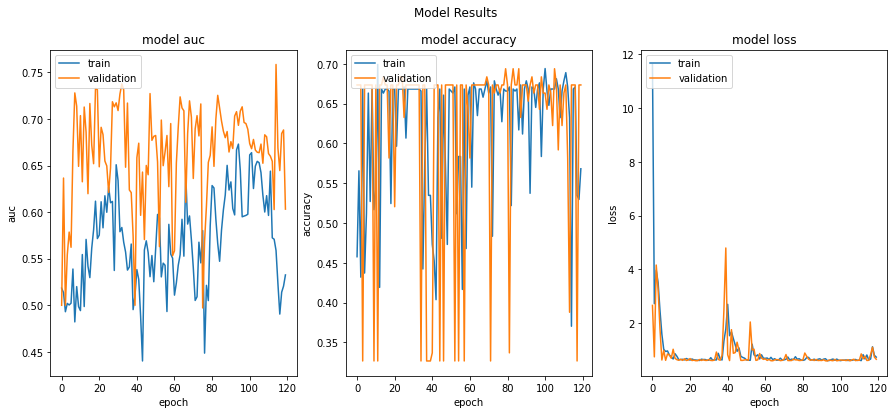

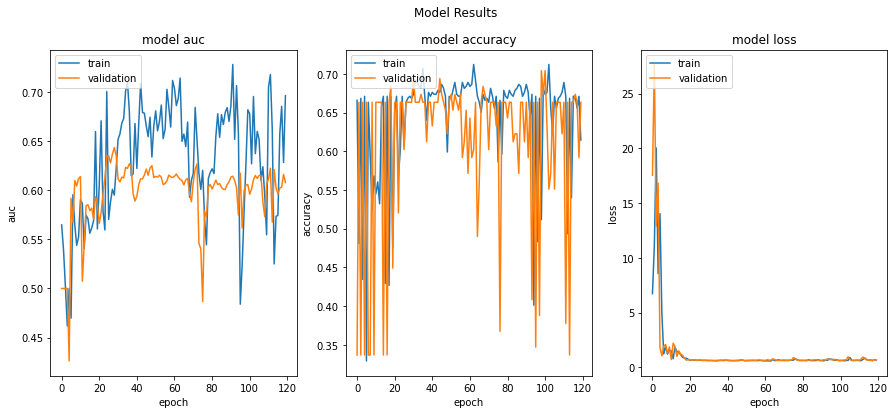

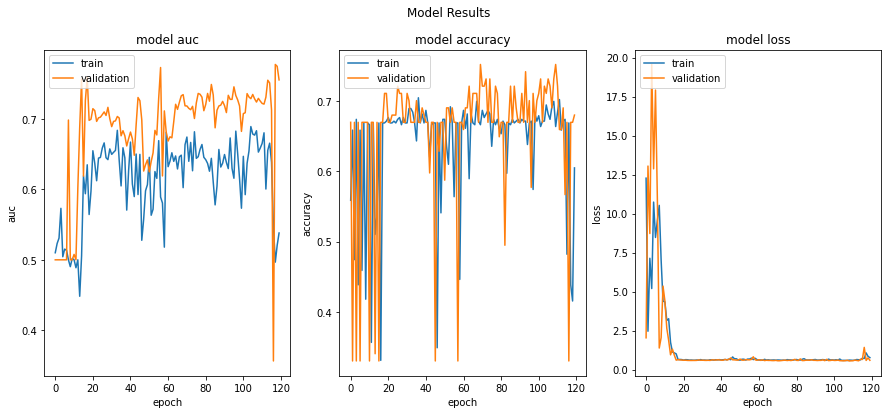

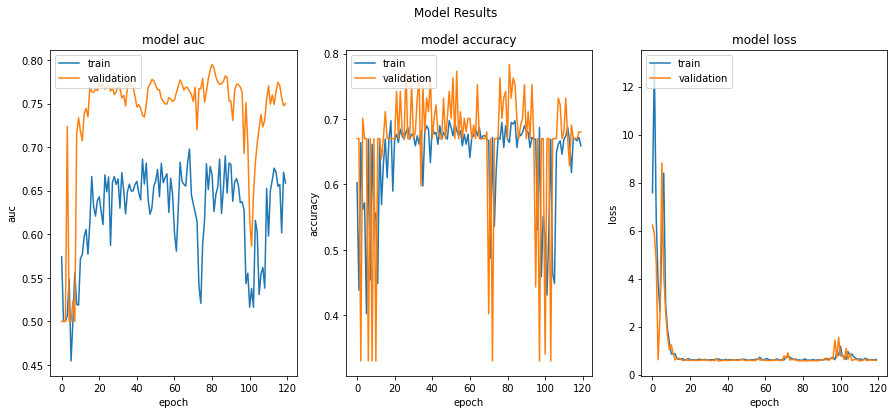

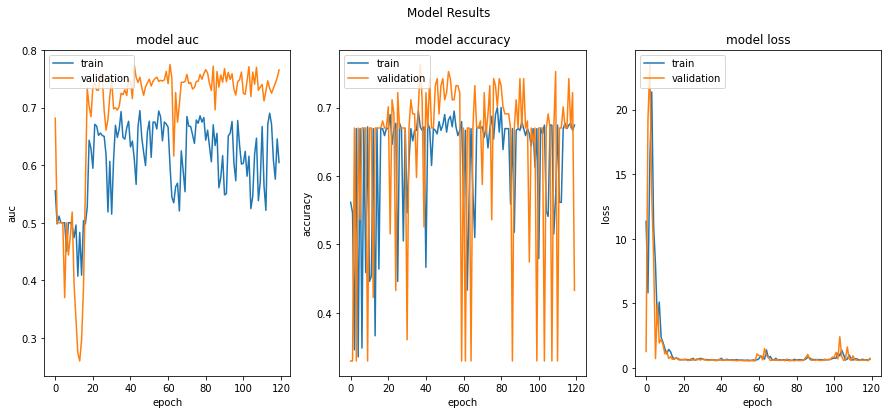

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.7585226893424988 - Accuracy: 0.6734693646430969 - Loss: 0.6153214573860168
------------------------------------------------------------------------
> Fold 2 - AUC: 0.6435897350311279 - Accuracy: 0.6632652878761292 - Loss: 0.6254917979240417
------------------------------------------------------------------------
> Fold 3 - AUC: 0.7771634459495544 - Accuracy: 0.6701030731201172 - Loss: 0.5919944643974304
------------------------------------------------------------------------
> Fold 4 - AUC: 0.7949519157409668 - Accuracy: 0.6701030731201172 - Loss: 0.5800821781158447
------------------------------------------------------------------------
> Fold 5 - AUC: 0.7752403616905212 - Accuracy: 0.3298968970775604 - Loss: 0.9183905720710754
------------------------------------------------------------------------
Average s

In [34]:
# That did not work as well as it did before, but it's pretty close.
# in this cell, I will tweak hyperparameters until it improves the average
# AUC from the cell above, and if it doesn't, I will explain what I've tried
# see: commented-out lines
# The rationale here is with an augmented dataset, we should train longer to improve performance without overfitting

# cv(model_t5, 120, 64) # doubling number of epochs 
# cv(model_t5, 60, 128) # doubling batch size
cv(model_t5, 120, 128) # doubling both -- this worked the best

In [35]:
# the best fold from above is fold 1, loading that model and testing it on leaderboard
model = tf.keras.models.load_model('/content/saved_models/model_1.h5')
test(model, 'trial-6-data-augmentation.csv')

## Next: CNN Architecture to replace the Fully-Connected Network in the Template

In these trials (or tuning attempts) I will vary the following hyperparameters one by one to explore their effects on performance:
* **Number of filters**: increases size of network (# trainable parameters), should improve performance despite being more expensive to train
* **Kernel sizes**: changes in kernel sizes will alter the features that can be extracted from each region. 
* **Layers**: again, changes in network depth should improve performance, despite being more expensive to train.

I will continue to implement checkpoints such that the best model during training is persisted for the testing phase.

### Trial 7 - Convolutional Neural Network
Thoughts and observations from trial 6: 
* leaderboard score did not improve, and any model architecture just overfits to the dev/val set once it's trained long enough to converge
* I've tried tuning the hyperparameters and model architecture, and I believe the next way to improve my performance using the data science life cycle for tuning is with more training/dev data (since the error on the public leaderboard is increasing)!
* My best public leaderboard score remains at ~0.8 

Plan for trial 7: I'll start using CNNs in this trial, I'll start by using cross validation on a basic architecture

In [36]:
from tensorflow.keras.layers import MaxPooling2D

# this model architecture was adopted from the CNN used in the data augmentation walkthrough
# from the assignment outline
cnn_model = Sequential([
  Input(shape=(256, 256, 2)),
  # scaling, # no data augmentation yet
  # augmentation,
  Conv2D(16, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Conv2D(32, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Conv2D(64, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Flatten(),
  Dense(128, activation='relu'),
  Dense(1, activation='sigmoid')
])

cnn_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 256, 256, 16)      304       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 65536)             0

Epoch 1/30
6/6 [==============================] - 32s 460ms/step - loss: 462.5474 - binary_accuracy: 0.6059 - auc: 0.4948 - val_loss: 97.9928 - val_binary_accuracy: 0.3469 - val_auc: 0.5000
Epoch 2/30
6/6 [==============================] - 1s 125ms/step - loss: 34.2878 - binary_accuracy: 0.4824 - auc: 0.5059 - val_loss: 5.1621 - val_binary_accuracy: 0.6531 - val_auc: 0.5045
Epoch 3/30
6/6 [==============================] - 1s 125ms/step - loss: 2.7925 - binary_accuracy: 0.5059 - auc: 0.4934 - val_loss: 3.4620 - val_binary_accuracy: 0.6531 - val_auc: 0.5000
Epoch 4/30
6/6 [==============================] - 1s 123ms/step - loss: 1.5050 - binary_accuracy: 0.6206 - auc: 0.5519 - val_loss: 0.8329 - val_binary_accuracy: 0.4422 - val_auc: 0.6877
Epoch 5/30
6/6 [==============================] - 1s 124ms/step - loss: 0.6126 - binary_accuracy: 0.6500 - auc: 0.6832 - val_loss: 0.6841 - val_binary_accuracy: 0.6803 - val_auc: 0.7070
Epoch 6/30
6/6 [==============================] - 1s 124ms/step -

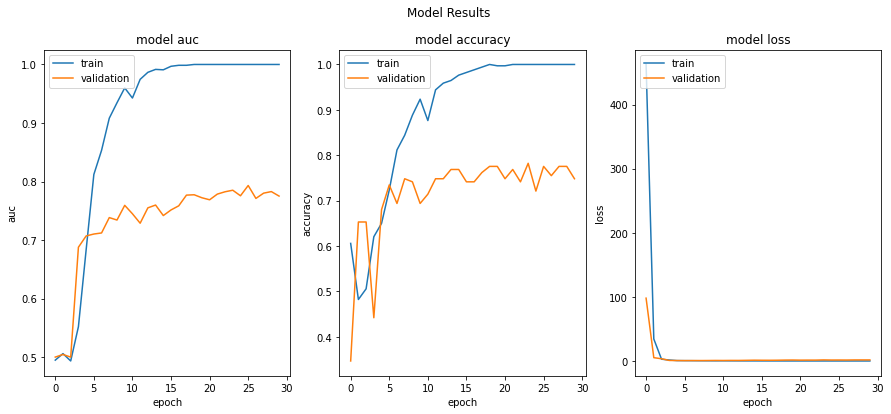

In [37]:
# before cross-validation, I'll train the model using a hold-out set as done in
# the template just to give me a benchmark
epochs = 30
batch_size = 64

cnn_model.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss='binary_crossentropy',
  metrics=['BinaryAccuracy', 'AUC']
)

history = cnn_model.fit(
    x = x_train,
    y = y_train,
    batch_size = batch_size,
    validation_split=0.3,
    epochs=epochs
)

results_viz(history)

Looks like overfitting occurs after ~20 epochs

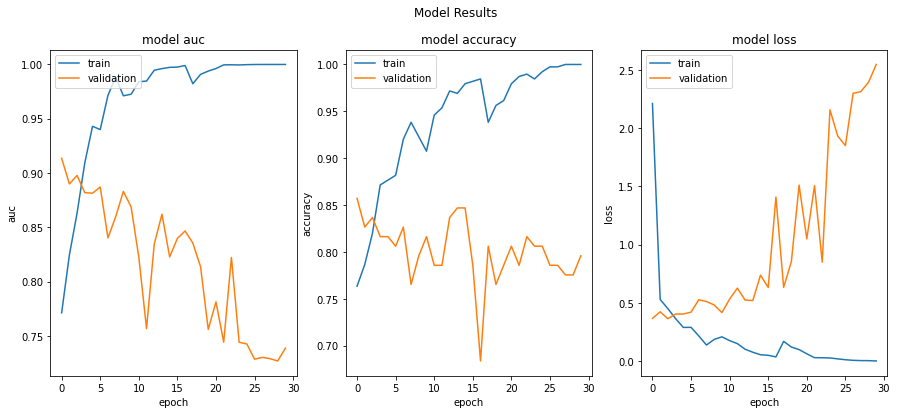

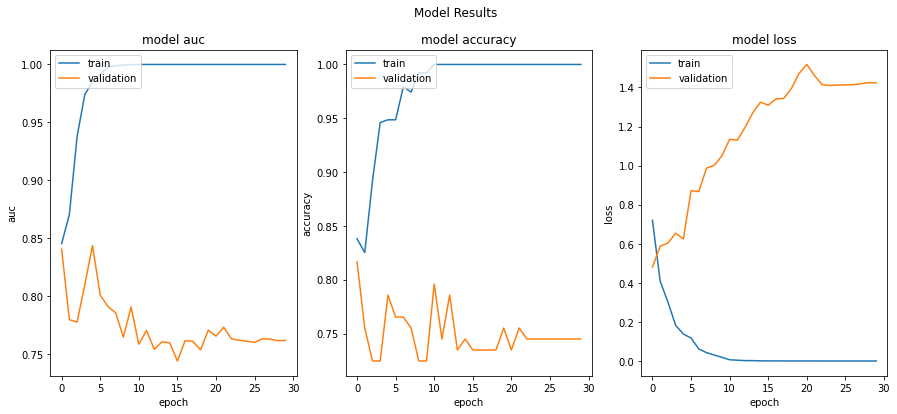

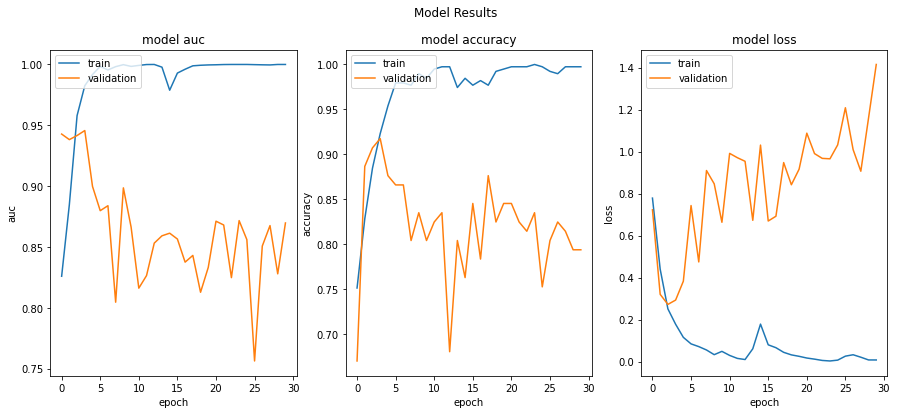

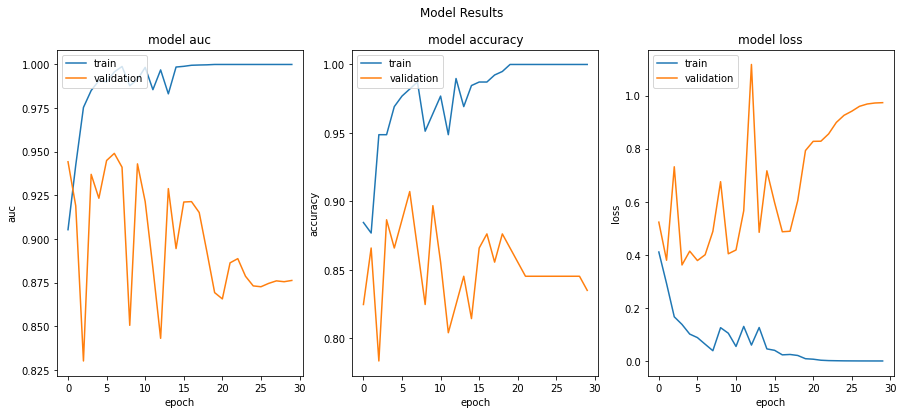

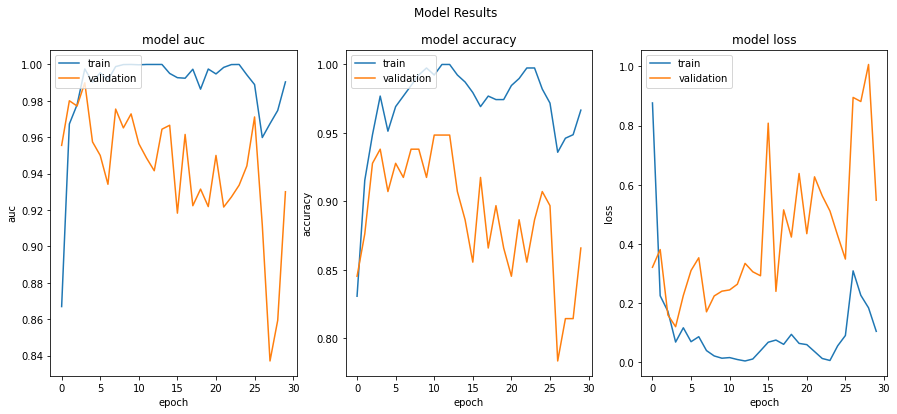

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9135890007019043 - Accuracy: 0.8571428656578064 - Loss: 0.3681536614894867
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8435897827148438 - Accuracy: 0.7857142686843872 - Loss: 0.6241404414176941
------------------------------------------------------------------------
> Fold 3 - AUC: 0.9456730484962463 - Accuracy: 0.9175257682800293 - Loss: 0.29277336597442627
------------------------------------------------------------------------
> Fold 4 - AUC: 0.9490383267402649 - Accuracy: 0.907216489315033 - Loss: 0.400390625
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9899038076400757 - Accuracy: 0.938144326210022 - Loss: 0.12084966897964478
------------------------------------------------------------------------
Average scores f

In [38]:
# using the basic hyperparameters from the template, just with a different model
cv(cnn_model, 30, 64)

In [39]:
model = tf.keras.models.load_model('/content/saved_models/model_5.h5')
test(model, 'trial-7-cnn.csv')

### Trial 8 - Convolutional Neural Network with data augmentation
Thoughts and observations from trial 7: 
* leaderboard score did not improve, in fact, it was much worse at 0.67465
* Training on a holdout set appears to overfit, and this also appears to be the case with cross validation despite the scores on the validation set being >0.9. 
* My best public leaderboard score remains at ~0.8 

Plan for trial 8: I'll supplement the CNN with data augmentation to increase the volume of validation set data, as per the data science life cycle for tuning (Training and Dev performance are both good, test error is high)

In [40]:
from tensorflow.keras.layers import RandomZoom

scaling = tf.keras.Sequential([
  Rescaling(1./255)
])

augmentation = tf.keras.Sequential([
  RandomFlip("horizontal_and_vertical"),
  RandomRotation(0.2), # random rotation hurt performance in my experience
  RandomZoom(0.2) # also going to experiment with random zoom
])

In [41]:
# Redefining the model for this trial
cnn_model_aug = Sequential([
  Input(shape=(256, 256, 2)),
  scaling,
  augmentation,
  Conv2D(16, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Conv2D(32, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Conv2D(64, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Flatten(),
  Dense(128, activation='relu'),
  Dense(1, activation='sigmoid')
])

cnn_model_aug.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 256, 256, 2)       0         
_________________________________________________________________
sequential_1 (Sequential)    (None, 256, 256, 2)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 16)      304       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 64)       

Epoch 1/120
3/3 [==============================] - 6s 1s/step - loss: 2.7745 - binary_accuracy: 0.6765 - auc: 0.4662 - val_loss: 1.3209 - val_binary_accuracy: 0.3469 - val_auc: 0.6469
Epoch 2/120
3/3 [==============================] - 1s 272ms/step - loss: 1.0395 - binary_accuracy: 0.3441 - auc: 0.5138 - val_loss: 0.6493 - val_binary_accuracy: 0.6531 - val_auc: 0.5853
Epoch 3/120
3/3 [==============================] - 1s 276ms/step - loss: 0.6411 - binary_accuracy: 0.6765 - auc: 0.4919 - val_loss: 0.6453 - val_binary_accuracy: 0.6531 - val_auc: 0.5966
Epoch 4/120
3/3 [==============================] - 1s 270ms/step - loss: 0.6344 - binary_accuracy: 0.6765 - auc: 0.5116 - val_loss: 0.6595 - val_binary_accuracy: 0.6531 - val_auc: 0.6416
Epoch 5/120
3/3 [==============================] - 1s 271ms/step - loss: 0.6373 - binary_accuracy: 0.6765 - auc: 0.4413 - val_loss: 0.6438 - val_binary_accuracy: 0.6531 - val_auc: 0.6683
Epoch 6/120
3/3 [==============================] - 1s 271ms/step - l

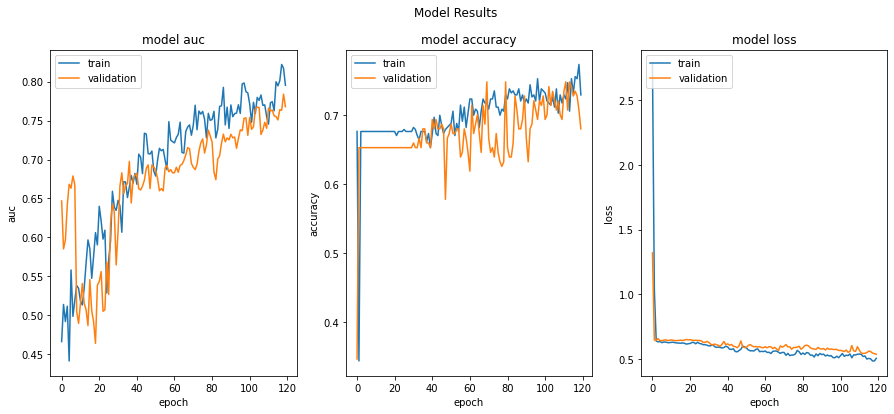

In [42]:
batch_size = 128
epochs = 120

cnn_model_aug.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss='binary_crossentropy',
  metrics=['BinaryAccuracy', 'AUC']
)

history = cnn_model_aug.fit(
    x = x_train,
    y = y_train,
    batch_size = batch_size,
    validation_split=0.3,
    epochs=epochs
)

results_viz(history)

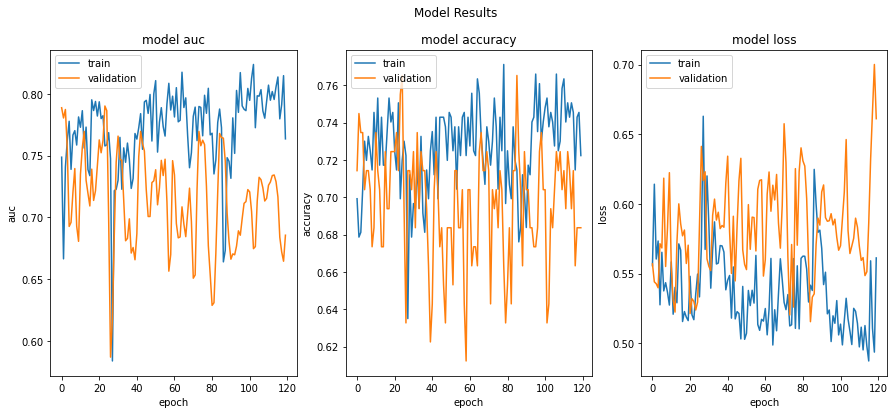

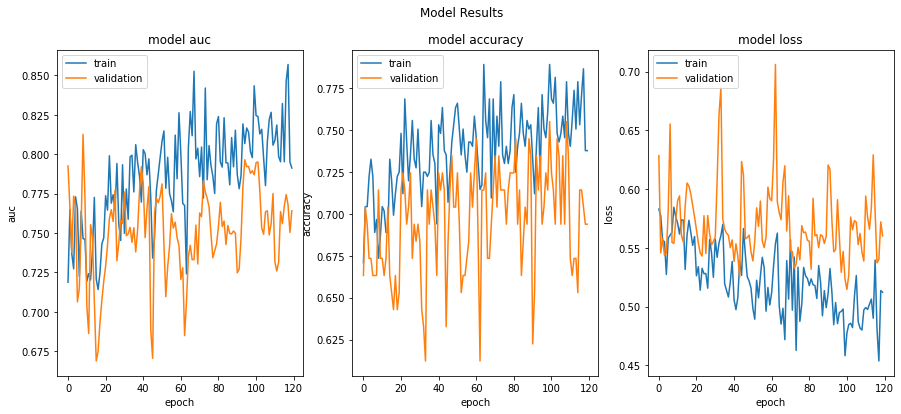

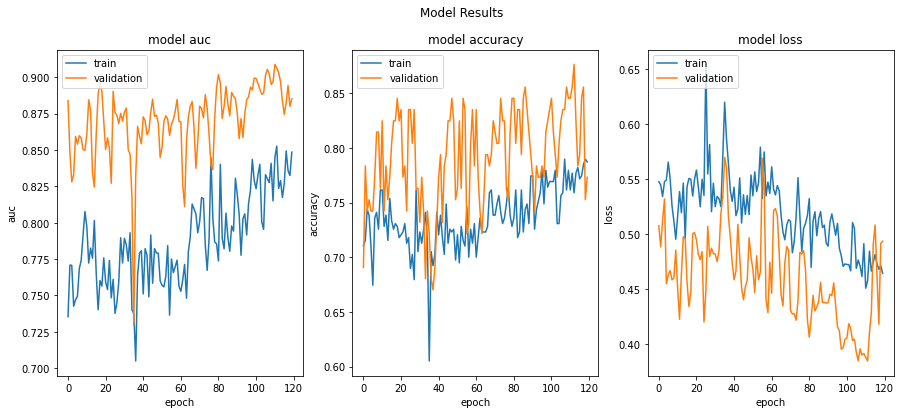

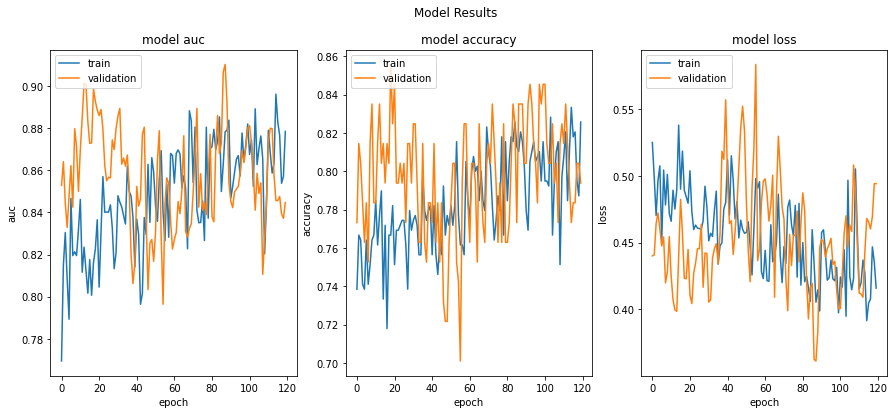

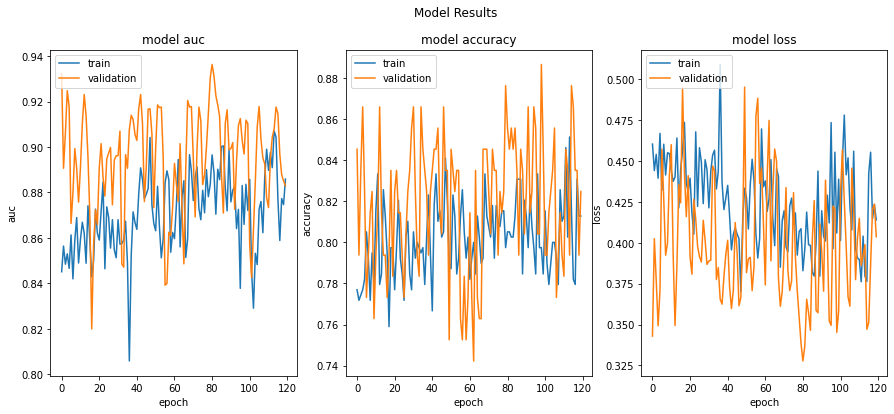

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.7902462482452393 - Accuracy: 0.7551020383834839 - Loss: 0.5238321423530579
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8125873804092407 - Accuracy: 0.7142857313156128 - Loss: 0.5537391901016235
------------------------------------------------------------------------
> Fold 3 - AUC: 0.9088941812515259 - Accuracy: 0.8453608155250549 - Loss: 0.38836470246315
------------------------------------------------------------------------
> Fold 4 - AUC: 0.9103366136550903 - Accuracy: 0.8350515365600586 - Loss: 0.36128896474838257
------------------------------------------------------------------------
> Fold 5 - AUC: 0.936298131942749 - Accuracy: 0.8556700944900513 - Loss: 0.3277572989463806
------------------------------------------------------------------------
Average sco

In [43]:
# cv(cnn_model_aug, 30, 64) # This performs much worse, so I'll try training longer with a larger batch size
cv(cnn_model_aug, 120, 128)

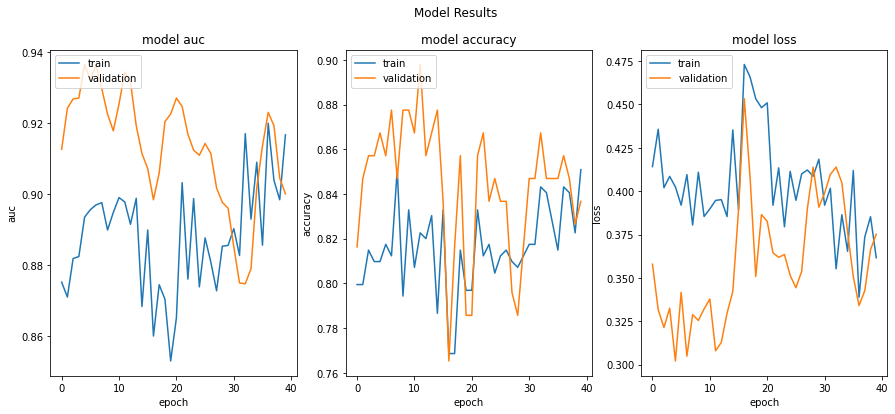

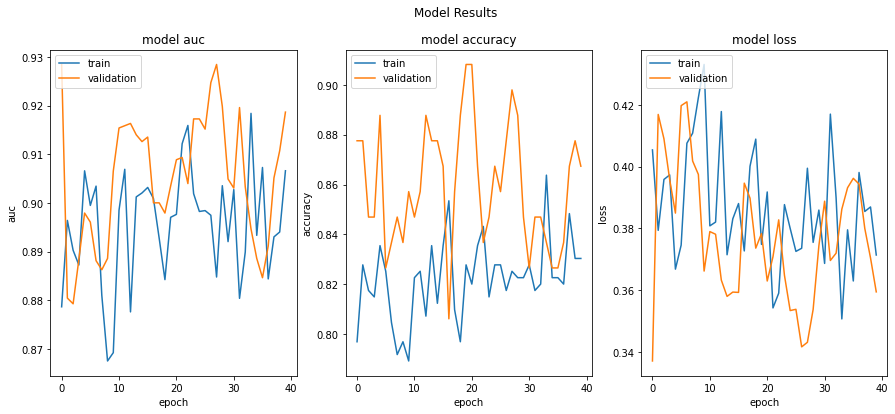

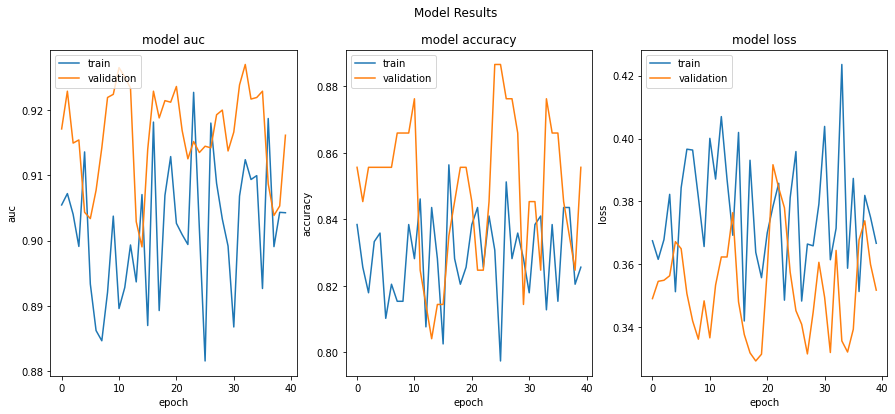

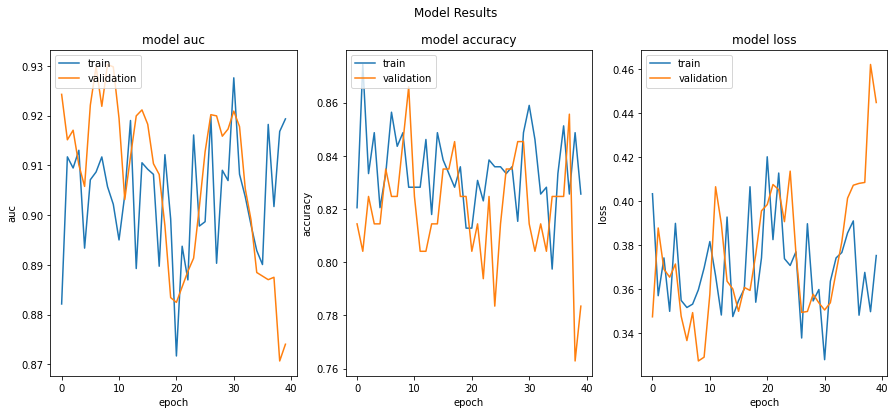

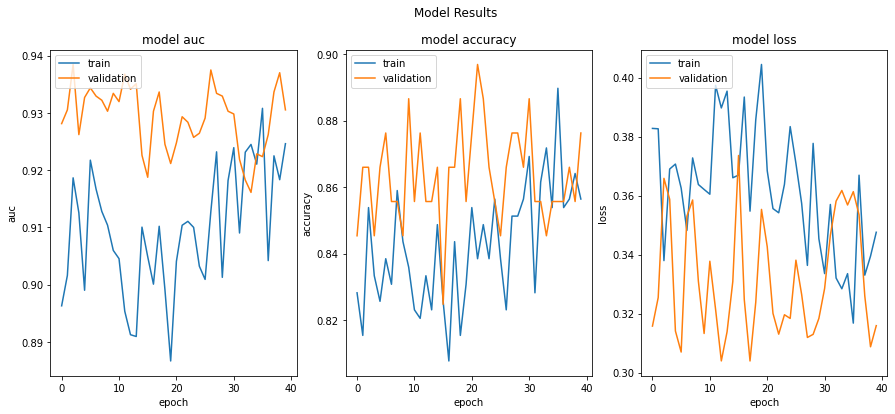

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.9365530610084534 - Accuracy: 0.8673469424247742 - Loss: 0.3021416962146759
------------------------------------------------------------------------
> Fold 2 - AUC: 0.9284382462501526 - Accuracy: 0.8979591727256775 - Loss: 0.3431139290332794
------------------------------------------------------------------------
> Fold 3 - AUC: 0.9269230961799622 - Accuracy: 0.8247422575950623 - Loss: 0.3644118309020996
------------------------------------------------------------------------
> Fold 4 - AUC: 0.9302884340286255 - Accuracy: 0.8453608155250549 - Loss: 0.3272552192211151
------------------------------------------------------------------------
> Fold 5 - AUC: 0.9384614825248718 - Accuracy: 0.8659793734550476 - Loss: 0.36585694551467896
------------------------------------------------------------------------
Average 

In [44]:
# This is bouncing all over the place, and I don't really know why the 
# best AUC is after just a few epochs, so I'll try to decrease the learning rate
cv(cnn_model_aug, 40, 128, 0.0005)

### Trial 9 - Tuning a CNN, Regularization
Thoughts and observations from trial 8: 
* Everything I did with data augmentation appears to overfit, despite applying data augmentation
* Lowering the learning rate didn't appear to slow down convergence, and this doesn't really matter because it appears to overfit in the first few epochs anyway 
* Not testing yet as I'm out of daily submissions at the moment

Plan for trial 9: I continue to struggle with the issue of having high test set error, despite having training and validation AUCs >0.9 averaged over 5 folds, so I'll try and experiment with dropout now that I am working with an augmented dataset. In other words, my lack of validation data should have been addressed through the application of data augmentation, so I should experiment with regularization techniques next to combat the apparent overfitting issue.

In [45]:
# Redefining the model for this trial, checking to see the impact of dropout
tuned_cnn = Sequential([
  Input(shape=(256, 256, 2)),
  scaling,
  augmentation,
  Conv2D(16, 3, padding='same', activation='relu'),
  Dropout(0.2),
  MaxPooling2D(),
  Conv2D(32, 3, padding='same', activation='relu'),
  Dropout(0.2),
  MaxPooling2D(),
  Conv2D(64, 3, padding='same', activation='relu'),
  Dropout(0.2),
  MaxPooling2D(),
  Flatten(),
  Dense(128, activation='relu'),
  Dropout(0.2),
  Dense(1, activation='sigmoid')
])

tuned_cnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 256, 256, 2)       0         
_________________________________________________________________
sequential_1 (Sequential)    (None, 256, 256, 2)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 16)      304       
_________________________________________________________________
dropout (Dropout)            (None, 256, 256, 16)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 32)      4640      
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 128, 32)      0

Epoch 1/300
3/3 [==============================] - 3s 561ms/step - loss: 6.2043 - binary_accuracy: 0.6059 - auc: 0.5225 - val_loss: 0.7078 - val_binary_accuracy: 0.3469 - val_auc: 0.5971
Epoch 2/300
3/3 [==============================] - 1s 362ms/step - loss: 1.1584 - binary_accuracy: 0.3735 - auc: 0.5345 - val_loss: 0.6475 - val_binary_accuracy: 0.6531 - val_auc: 0.4838
Epoch 3/300
3/3 [==============================] - 1s 355ms/step - loss: 0.6478 - binary_accuracy: 0.6794 - auc: 0.5592 - val_loss: 0.6502 - val_binary_accuracy: 0.6531 - val_auc: 0.3907
Epoch 4/300
3/3 [==============================] - 1s 358ms/step - loss: 0.6262 - binary_accuracy: 0.6765 - auc: 0.5539 - val_loss: 0.6784 - val_binary_accuracy: 0.6531 - val_auc: 0.4453
Epoch 5/300
3/3 [==============================] - 1s 357ms/step - loss: 0.6480 - binary_accuracy: 0.6765 - auc: 0.5175 - val_loss: 0.6622 - val_binary_accuracy: 0.6531 - val_auc: 0.4266
Epoch 6/300
3/3 [==============================] - 1s 355ms/step 

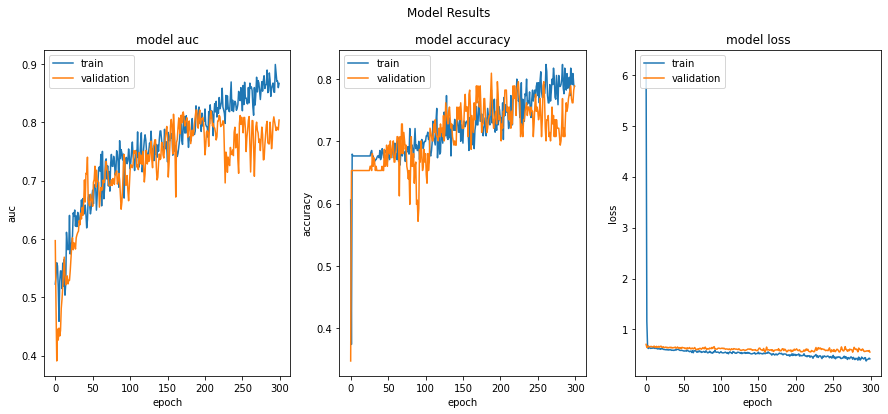

In [46]:
tuned_cnn.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss='binary_crossentropy',
  metrics=['BinaryAccuracy', 'AUC']
)

history = tuned_cnn.fit(
    x = x_train,
    y = y_train,
    batch_size = 128,
    validation_split=0.3,
    epochs=300
)

results_viz(history)

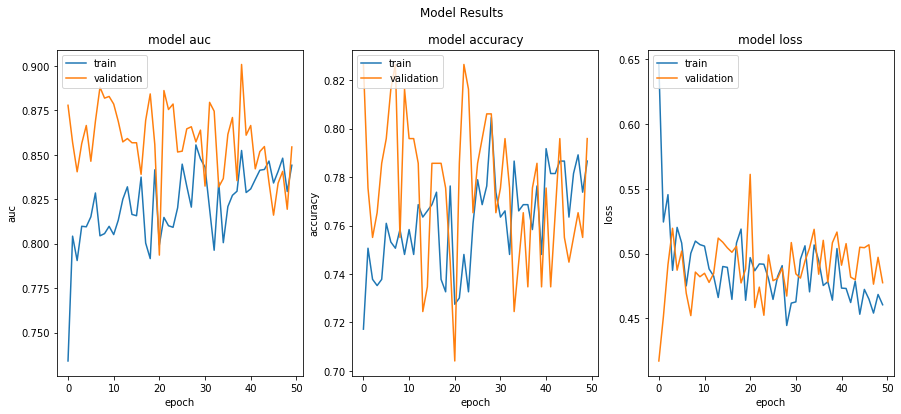

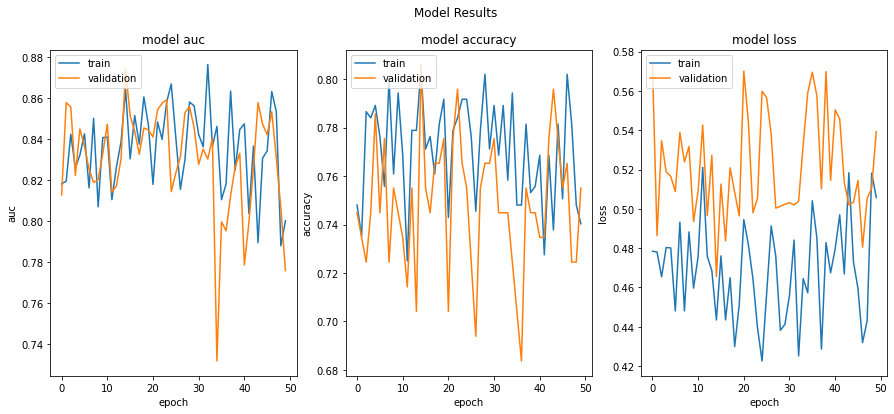

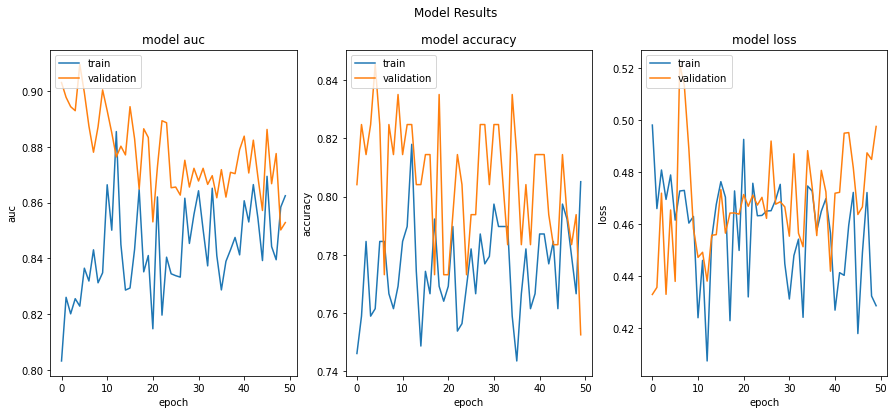

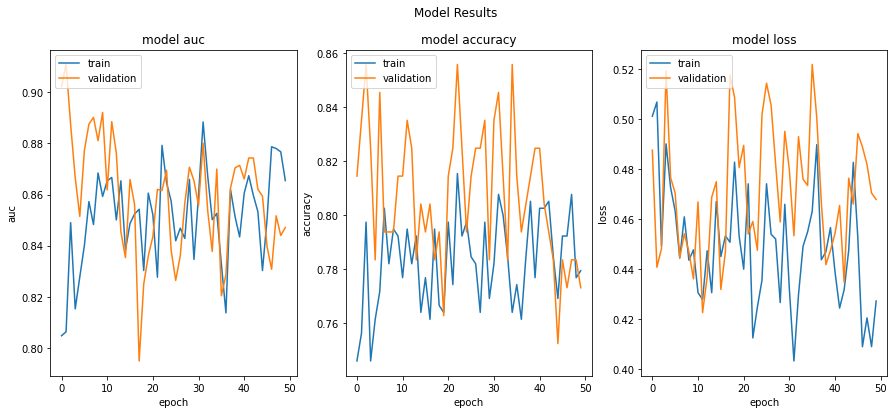

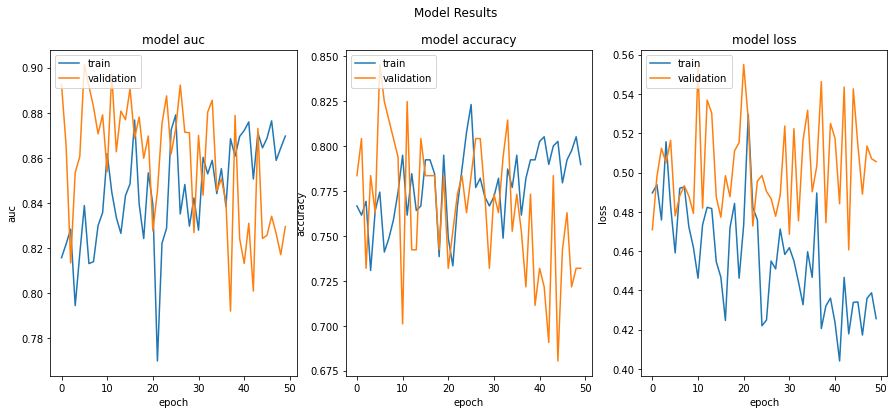

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - AUC: 0.900804877281189 - Accuracy: 0.7857142686843872 - Loss: 0.5083312392234802
------------------------------------------------------------------------
> Fold 2 - AUC: 0.8741258382797241 - Accuracy: 0.8061224222183228 - Loss: 0.46553102135658264
------------------------------------------------------------------------
> Fold 3 - AUC: 0.9096153974533081 - Accuracy: 0.8453608155250549 - Loss: 0.4654260575771332
------------------------------------------------------------------------
> Fold 4 - AUC: 0.9108172655105591 - Accuracy: 0.8350515365600586 - Loss: 0.44060975313186646
------------------------------------------------------------------------
> Fold 5 - AUC: 0.901442289352417 - Accuracy: 0.8453608155250549 - Loss: 0.4779183566570282
------------------------------------------------------------------------
Average s

In [47]:
# trying cross validation next
cv(tuned_cnn, 50, 64)

## Bonus: Transfer learning and up-training existing models
Lastly, I will attempt to improve my performance over the best CNN approach to date, by following the provided example (https://www.tensorflow.org/tutorials/images/transfer_learning)



### Trial 10 - Experimenting with Transfer Learning
Thoughts and observations from trial 9: 
* Using dropout regularization values of 0.1, 0.2, and 0.3 maxed-out at roughly 0.8 AUC after training for hundreds of epochs on a holdout set
* cross-validation results are still very noisy
* I have attacked every challenge I've faced with no performance improvement over my second trial
  * The fully-connected model would not improve further after tuning hyperparameters and model architecture, so I tried data augmentation.
  * After I tried data augmentation, my validation AUC improved a bit (~0.85 over 5 folds), but I got as much out of a fully-connected model as I could, so I pivoted to CNN architectures
  * CNNs appeared to overfit to the training and dev/validation sets despite the use of data augmentation, so I tried regularization methods, and validation AUC did not improve above 0.8. Cross validation still had noisy performance despite the inclusion of dropout.

Plan for trial 10: The last thing I haven't tried is transfer learning, which I will explore using the provided example in the assignment outline.

58900480/58889256 [==============================] - 1s 0us/step


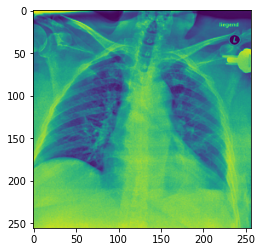

In [69]:
from keras.applications.vgg16 import VGG16

# VGG needs input images with 3 channels, so I'll extend the training data to have 3 channels and appear RGB
# x_train is currently (487, 256, 256, 2)
rgb = x_train[:,:,:,0]
# rgb.shape # now it's (487,256,256)
plt.imshow(rgb[0, :, :]) # looks the same as it did before
rgb = np.repeat(rgb[..., np.newaxis], 3, -1) # repeat the same values across 3 channels
rgb.shape # now we have 487 samples of (487,256,256,3)

In [99]:
from tensorflow.keras.layers import GlobalAveragePooling2D

base = VGG16(include_top=False, input_shape=(256,256,3))
base.trainable = False

def build_transfer():
  inputs = Input(shape=(256,256,3))
  scaling = Rescaling(1./127.5, offset=-1)(inputs) # rescaling to [-1,1] for VGG16
  x = base(scaling, training=False)
  y = GlobalAveragePooling2D()(x)
  z = Dropout(0.2)(y)
  outputs = Dense(1, activation='sigmoid')(z)
  model = tf.keras.Model(inputs, outputs)
  return model

model = build_transfer()

model.compile(
        optimizer=tf.keras.optimizers.Adam(), 
        loss='binary_crossentropy',
        metrics=['BinaryAccuracy', 'AUC']
        )

model.summary()

Model: "model_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 256, 256, 3)]     0         
_________________________________________________________________
rescaling_3 (Rescaling)      (None, 256, 256, 3)       0         
_________________________________________________________________
vgg16 (Functional)           (None, 8, 8, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_27 (Dense)             (None, 1)                 513       
Total params: 14,715,201
Trainable params: 513
Non-trainable params: 14,714,688
____________________________________________

Epoch 1/60
6/6 [==============================] - 6s 888ms/step - loss: 0.6586 - binary_accuracy: 0.6324 - auc: 0.4516 - val_loss: 0.6445 - val_binary_accuracy: 0.6531 - val_auc: 0.5366
Epoch 2/60
6/6 [==============================] - 5s 809ms/step - loss: 0.6246 - binary_accuracy: 0.6647 - auc: 0.5795 - val_loss: 0.6422 - val_binary_accuracy: 0.6531 - val_auc: 0.5805
Epoch 3/60
6/6 [==============================] - 5s 810ms/step - loss: 0.6433 - binary_accuracy: 0.6735 - auc: 0.4820 - val_loss: 0.6406 - val_binary_accuracy: 0.6531 - val_auc: 0.5988
Epoch 4/60
6/6 [==============================] - 5s 811ms/step - loss: 0.6432 - binary_accuracy: 0.6559 - auc: 0.5122 - val_loss: 0.6380 - val_binary_accuracy: 0.6531 - val_auc: 0.6366
Epoch 5/60
6/6 [==============================] - 5s 805ms/step - loss: 0.6307 - binary_accuracy: 0.6765 - auc: 0.5340 - val_loss: 0.6349 - val_binary_accuracy: 0.6531 - val_auc: 0.6687
Epoch 6/60
6/6 [==============================] - 5s 808ms/step - loss

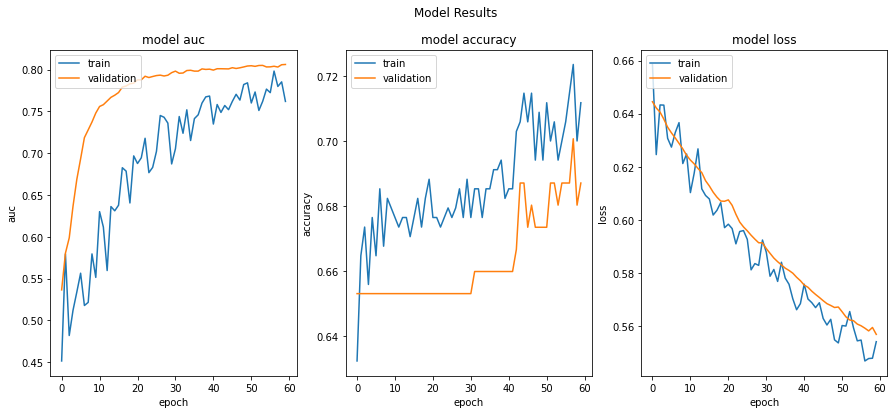

In [100]:
history = model.fit(x = rgb,
                    y = y_train,
                    batch_size = 64,
                    validation_split=0.3,
                    epochs=60
                    )

results_viz(history)

In [101]:
# let's try mobilenetv2, which was used in the provided walkthrough
# just replacing the base model I use for this one
from keras.applications.mobilenet_v2 import MobileNetV2

base = MobileNetV2(include_top=False, input_shape=(256,256,3))
base.trainable = False

def build_transfer():
  inputs = Input(shape=(256,256,3))
  scaling = Rescaling(1./127.5, offset=-1)(inputs) # rescaling to [-1,1] for MobileNetV2
  x = base(scaling, training=False)
  y = GlobalAveragePooling2D()(x)
  z = Dropout(0.2)(y)
  outputs = Dense(1, activation='sigmoid')(z)
  model = tf.keras.Model(inputs, outputs)
  return model

model = build_transfer()

model.compile(
        optimizer=tf.keras.optimizers.Adam(), 
        loss='binary_crossentropy',
        metrics=['BinaryAccuracy', 'AUC']
        )

model.summary()

9420800/9406464 [==============================] - 0s 0us/step
Model: "model_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        [(None, 256, 256, 3)]     0         
_________________________________________________________________
rescaling_4 (Rescaling)      (None, 256, 256, 3)       0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, 8, 8, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d_3 ( (None, 1280)              0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 1281      
Total params: 2,259,265
Trainable params: 1,281
Non-trainable

Epoch 1/60
6/6 [==============================] - 8s 738ms/step - loss: 0.7357 - binary_accuracy: 0.5647 - auc: 0.4527 - val_loss: 0.7185 - val_binary_accuracy: 0.6531 - val_auc: 0.4641
Epoch 2/60
6/6 [==============================] - 2s 271ms/step - loss: 0.6931 - binary_accuracy: 0.6441 - auc: 0.5086 - val_loss: 0.6496 - val_binary_accuracy: 0.6531 - val_auc: 0.5574
Epoch 3/60
6/6 [==============================] - 2s 274ms/step - loss: 0.6486 - binary_accuracy: 0.6735 - auc: 0.5870 - val_loss: 0.6182 - val_binary_accuracy: 0.6735 - val_auc: 0.6334
Epoch 4/60
6/6 [==============================] - 2s 279ms/step - loss: 0.6153 - binary_accuracy: 0.6765 - auc: 0.6374 - val_loss: 0.6056 - val_binary_accuracy: 0.7007 - val_auc: 0.6733
Epoch 5/60
6/6 [==============================] - 2s 272ms/step - loss: 0.5881 - binary_accuracy: 0.6971 - auc: 0.6885 - val_loss: 0.5805 - val_binary_accuracy: 0.7415 - val_auc: 0.6985
Epoch 6/60
6/6 [==============================] - 2s 273ms/step - loss

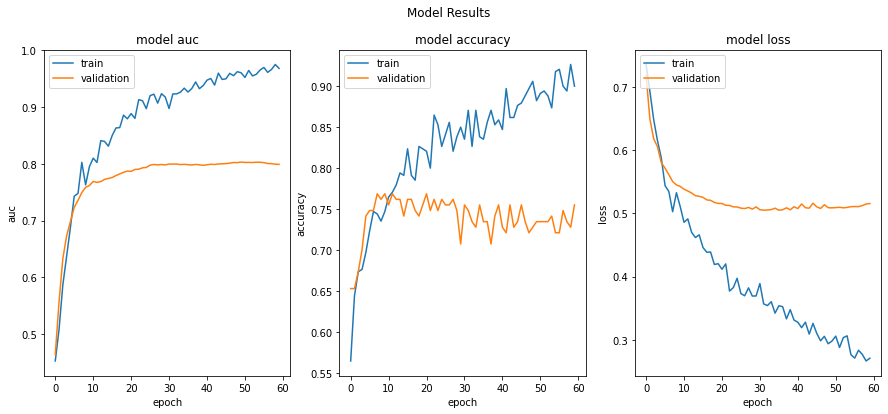

In [102]:
history = model.fit(x = rgb,
                    y = y_train,
                    batch_size = 64,
                    validation_split=0.3,
                    epochs=60
                    )

results_viz(history)

Thoughts and observations for trial 10: I tried using several combinations of freezing certain layers, along with adding data augmentation, and performance did not improve beyond previous approaches, but this was a neat technique to explore.

* Fine tuning weights with a single classification neuron on top did not improve performance (~0.7 val AUC).
* rescaled inputs to [-1,1] and the val AUC improved to 0.78 after 30 epochs
* trained for 60 epochs: validation AUC topped out at 0.8
* MobileNetV2 for 60 epochs gave me the same performance, but took less time (likely due to fewer parameters)
* looks like VGG could benefit from longer training as its loss doesn't converge, but MobileNetV2 does

# Task 5: Questions

**Q1. What is the validation method used in the example template? Considering the dataset is a bit small, is it an appropriate approach? If not, what would you suggest? (you are not expected to change but you are allowed to do that if you want)**

A1. The validation method used in the example template is the use of a simple hold-out set. Here, 30% of the training data is held-out for validation and is evaluated while training (as shown in the cell output where model.fit() is run). The training set is small, at just 487 image samples. This leaves roughly 341 samples for training and 146 samples for development/validation. So, this is not the most appropriate validation approach, and cross-validation should be used to train on the widest variety of image samples possible such that it can best generalize to test samples. In this assignment, I explored the application of k-fold cross validation, starting with 5 folds and increasing the number of folds to 10 if the architecture did not take too long to train.

**Q2. What is the default model in the template? Is it a good one for image data? why?**

A2. The default model used in the template is a fully-connected feed-forward neural network. Fully connected neural networks are good classifiers, but they are not good for image data as they struggle to extract features effectively. This is due to the fact that fully-connected networks do not capture the spatial context/structure of training samples, hence why the image is first flattened in the template. Moreover, the number of weights becomes very large for fully-connected networks, and are much less for a CNN trained on similar image shapes.

CNNs also do not need to extract features as there is an explicit hierarchical representation of features. The depth of CNNs also reduces overfitting.

**Q3. Convolution neural network address what issues of a fully connected neural network and how?**

A3. Once again, the problem with fully-connected neural networks (especially in the context of image classification) is the number of trainable parameters/weights in each layer. For example, take the images used in this assignment which are size 256x256x2. The first fully connected layers would need 131072 trainable parameters/weights to start (as shown when it's flattened). This typically results in slower training time, and a chance of overfitting.

In the case of convolutional neural networks, the main image is subsequently reduced to smaller matrices in each layer using convolution so additional operations can be performed. Additionally, traditional fully-connected networks are not translation invariant, meaning that they react differently to the same geometry/object in a different position of an image. This is because spatial information is lost when the image is flattened.

**Q4. What's the different between 1d, 2d, and 3d convolution?**

A4. 

* 1D convolution: In 1D convolution, the kernel/filter moves in one direction to calculate the output, which will be a 1D array. This is commonly used for signal smoothing, and NLP tasks such as sentiment analysis.

* 2D convolution: In 2D convolution, the kernel/filter moves in two directions to calculate the convolutional output, which is a 2D matrix. This is commonly used in image classification tasks (like this assignment), as well as image generation, and pretty much any task where 2D spatial context is important.

* 3D convolution: In 3D convolution, the kernel moves in three directions to calculate a 3D volume as an output. This is common in deep learning applications where three-dimensional models/images where depth is important, such as fMRI imagery, or CT scans. 

**Q5. What is the difference between convolution and pooling?**

A5. The purpose of the convolutional layers is to detect multiple patterns and features in different regions in the input image. On the other hand, the pooling layer is used to progressively reduce the spatial size of this representation and therefore reduce the number of weights/parameters. This ultimately reduces the computation demands of the network, and also helps to control overfitting. 

In other words, the convolutional layers have parameters to learn, but pooling layers do not as they are simply reducing the size of the input for easier computation.